In [1]:
import scanpy as sc
import pandas as pd 
import numpy as np
from scipy.sparse import csr_matrix
import matplotlib.pyplot as plt
from nero import Harmonia
from tqdm import tqdm_notebook as tqdm
import warnings
import itertools as it
import pickle as pkl
from copy import copy

import matplotlib.patches as patches
from shapely.geometry import Point
from shapely.geometry.polygon import Polygon

In [2]:
# might need this, the most recent version of jupterlab I installed installed the most recent version of jedi which has been having problems with autocomplete
# see thread here: https://github.com/ipython/ipython/issues/10493
%config Completer.use_jedi = False
sc.settings.verbosity = 3
sc.settings.set_figure_params(dpi=80)

## Reading in Data

In [3]:
exps = dict()
for exp in range(5):
    exps[exp] = dict()

In [4]:
exps[0]['path'] = '/myvol/data2/20190831/20180831_L10C.h5ad'
exps[1]['path'] = '/myvol/data2/20190920/20190920_L20C1.h5ad'
exps[2]['path'] = '/myvol/data2/20190920/20190920_L20T.h5ad'
exps[3]['path'] = '/myvol/data2/20190831/20180831_L30C.h5ad'
exps[4]['path'] = '/myvol/data2/20190831/20180831_L30C8.h5ad'

In [5]:
for exp in exps:
    exps[exp]['adata'] = sc.read_h5ad(exps[exp]['path'])

In [6]:
for exp in exps:
    exps[exp]['label'] = exps[exp]['path'].split('/')[-1]

## Filtering for Cells, Labeling Human and Mouse Cells

In [7]:
human_genes = [i for i in exps[0]['adata'].var_names if i.startswith('hg19_')]
mouse_genes = [i for i in exps[0]['adata'].var_names if i.startswith('mm10_')]

Extract out separate adatas for each genome, and extract out UMIs as "n_counts" in obs (per cell) and in the vars (per gene).

In [8]:
def my_plot(ax, vals, tupe=None, thresh=None, max_y=None):
    ax.hist(vals,bins=np.logspace(np.log10(0.1),np.log10(50000), 500),color='gray') # logspace bins looks great!
    ax.set_yscale('log')
    ax.set_xscale('log')
    ax.set_title(tupe)
    ax.grid(which='both', alpha=0.5)
    if thresh != None:
        ax.vlines(thresh,0,max_y)
    return

In [9]:
filtering_vals = [[120, 70, 50, 30], 
                  [5000, 2000, 60, 30], 
                  [1200, 600, 500, 20], 
                  [500, 200, 30, 20], 
                  [300, 200, 30, 20]]

In [10]:
for exp, filtervals in zip(exps, filtering_vals):
    exps[exp]['adata_human'] = exps[exp]['adata'][:,human_genes].copy()
    exps[exp]['adata_human'].var_names = [i[5:] for i in exps[exp]['adata_human'].var_names] # no need for the genome tag at the beginning anymore
    exps[exp]['adata_mouse'] = exps[exp]['adata'][:,mouse_genes].copy()
    exps[exp]['adata_mouse'].var_names = [i[5:] for i in exps[exp]['adata_mouse'].var_names]
    
#     del exps[exp]['adata']
    
#     fig, axes = plt.subplots(1,4,figsize=(20,4))
#     for tupe, ax in zip(it.product([exps[exp]['adata_human'], exps[exp]['adata_mouse']],['counts','genes']), axes):
#         if tupe[1] == 'counts': # get counts
#             vals = sc.pp.filter_cells(tupe[0], min_counts=0,inplace=False)[1] # total number of UMIs observed
#         else:
#             vals = sc.pp.filter_cells(tupe[0], min_genes=0,inplace=False)[1] # total number of UMIs observed
#         my_plot(ax, vals)
#     plt.tight_layout()
#     plt.show()

    exps[exp]['human_min_counts'] = filtervals[0] #int(input())
    exps[exp]['human_min_genes'] = filtervals[1] #int(input())

    exps[exp]['mouse_min_counts'] = filtervals[2] #int(input())
    exps[exp]['mouse_min_genes'] = filtervals[3] #int(input())
    
#     exps[exp]['human_min_counts'] = int(input())
#     exps[exp]['human_min_genes'] = int(input())

#     exps[exp]['mouse_min_counts'] = int(input())
#     exps[exp]['mouse_min_genes'] = int(input())

In [11]:
for exp in exps:
    exps[exp]['adata_human'].obs['human_cells_counts_bool'] = sc.pp.filter_cells(exps[exp]['adata_human'],min_counts=exps[exp]['human_min_counts'],inplace=False)[0]
    exps[exp]['adata_human'].obs['human_cells_counts_vals'] = sc.pp.filter_cells(exps[exp]['adata_human'],min_counts=exps[exp]['human_min_counts'],inplace=False)[1]

    exps[exp]['adata_human'].obs['human_cells_genes_bool'] = sc.pp.filter_cells(exps[exp]['adata_human'],min_counts=exps[exp]['human_min_genes'],inplace=False)[0]
    exps[exp]['adata_human'].obs['human_cells_genes_vals'] = sc.pp.filter_cells(exps[exp]['adata_human'],min_counts=exps[exp]['human_min_genes'],inplace=False)[1]

    exps[exp]['adata_mouse'].obs['mouse_cells_counts_bool'] = sc.pp.filter_cells(exps[exp]['adata_mouse'],min_counts=exps[exp]['mouse_min_counts'],inplace=False)[0]
    exps[exp]['adata_mouse'].obs['mouse_cells_counts_vals'] = sc.pp.filter_cells(exps[exp]['adata_mouse'],min_counts=exps[exp]['mouse_min_counts'],inplace=False)[1]

    exps[exp]['adata_mouse'].obs['mouse_cells_genes_bool'] = sc.pp.filter_cells(exps[exp]['adata_mouse'],min_counts=exps[exp]['mouse_min_genes'],inplace=False)[0]
    exps[exp]['adata_mouse'].obs['mouse_cells_genes_vals'] = sc.pp.filter_cells(exps[exp]['adata_mouse'],min_counts=exps[exp]['mouse_min_genes'],inplace=False)[1]

filtered out 6595 cells that haveless than 120 counts
filtered out 6595 cells that haveless than 120 counts
filtered out 6385 cells that haveless than 70 counts
filtered out 6385 cells that haveless than 70 counts
filtered out 1176 cells that haveless than 50 counts
filtered out 1176 cells that haveless than 50 counts
filtered out 1056 cells that haveless than 30 counts
filtered out 1056 cells that haveless than 30 counts
filtered out 25230 cells that haveless than 5000 counts
filtered out 25230 cells that haveless than 5000 counts
filtered out 24805 cells that haveless than 2000 counts
filtered out 24805 cells that haveless than 2000 counts
filtered out 5436 cells that haveless than 60 counts
filtered out 5436 cells that haveless than 60 counts
filtered out 3065 cells that haveless than 30 counts
filtered out 3065 cells that haveless than 30 counts
filtered out 27486 cells that haveless than 1200 counts
filtered out 27486 cells that haveless than 1200 counts
filtered out 27371 cells t

In [12]:
for exp in exps:
    human = (exps[exp]['adata_human'].obs['human_cells_counts_bool'] == True) & (exps[exp]['adata_human'].obs['human_cells_genes_bool'] == True) & \
    (exps[exp]['adata_mouse'].obs['mouse_cells_counts_bool'] == False) & (exps[exp]['adata_mouse'].obs['mouse_cells_genes_bool'] == False)

    mouse = (exps[exp]['adata_mouse'].obs['mouse_cells_counts_bool'] == True) & (exps[exp]['adata_mouse'].obs['mouse_cells_genes_bool'] == True) & \
    (exps[exp]['adata_human'].obs['human_cells_counts_bool'] == False) & (exps[exp]['adata_human'].obs['human_cells_genes_bool'] == False)
    
    exps[exp]['adata_human'] = exps[exp]['adata_human'][human].copy()
    exps[exp]['adata_mouse'] = exps[exp]['adata_mouse'][mouse].copy()

In [13]:
exps[1]

{'path': '/myvol/data2/20190920/20190920_L20C1.h5ad',
 'adata': AnnData object with n_obs × n_vars = 26436 × 121472 ,
 'label': '20190920_L20C1.h5ad',
 'adata_human': AnnData object with n_obs × n_vars = 3 × 65476 
     obs: 'human_cells_counts_bool', 'human_cells_counts_vals', 'human_cells_genes_bool', 'human_cells_genes_vals',
 'adata_mouse': AnnData object with n_obs × n_vars = 19492 × 55996 
     obs: 'mouse_cells_counts_bool', 'mouse_cells_counts_vals', 'mouse_cells_genes_bool', 'mouse_cells_genes_vals',
 'human_min_counts': 5000,
 'human_min_genes': 2000,
 'mouse_min_counts': 60,
 'mouse_min_genes': 30}

## Combining Mouse and Human Cells, Filtering for Genes

In [14]:
for exp in exps:
    exps[exp]['adata'] = exps[exp]['adata'][np.unique(np.concatenate([exps[exp]['adata_human'].obs_names.values, exps[exp]['adata_mouse'].obs_names.values],axis=0))].copy()

In [15]:
adata = exps[0]['adata'].concatenate(exps[1]['adata'],exps[2]['adata'],exps[3]['adata'],exps[4]['adata'], join='inner').copy()

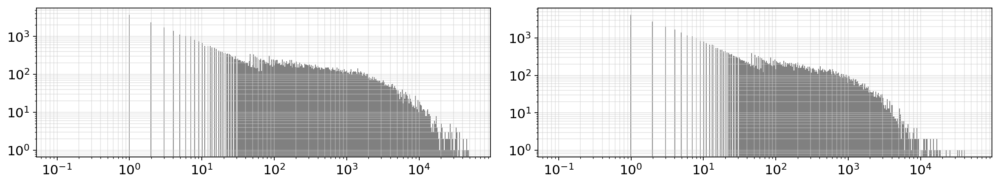

In [16]:
# for exp in exps:
fig, axes = plt.subplots(1,2,figsize=(15,3))
vals = sc.pp.filter_genes(adata, min_counts=0,inplace=False)[1] # total number of UMIs observed
my_plot(axes[0], vals)

vals = sc.pp.filter_genes(adata, min_cells=0,inplace=False)[1] # total number of UMIs observed
my_plot(axes[1], vals)

plt.tight_layout()
plt.show()

In [17]:
# for exp in exps:
sc.pp.filter_genes(adata,min_counts=60)
sc.pp.filter_genes(adata,min_cells=60)

filtered out 96904 genes that are detectedin less than 60 counts
filtered out 4170 genes that are detectedin less than 60 cells


## Mitochondrial Visualization
Decided not to filter at this time.

In [18]:
genelist = adata.var_names.tolist()
mito_genes_names_mouse = [gn for gn in genelist if gn.startswith('mm10_mt-')]
mito_genes_names_human = [gn for gn in genelist if gn.startswith('hg19_MT-')]
mito_genes_mouse = [genelist.index(gn) for gn in mito_genes_names_mouse]
mito_genes_human = [genelist.index(gn) for gn in mito_genes_names_human]

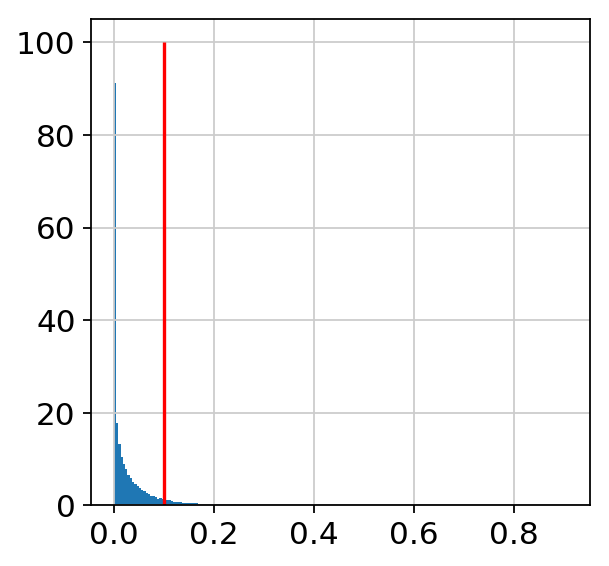

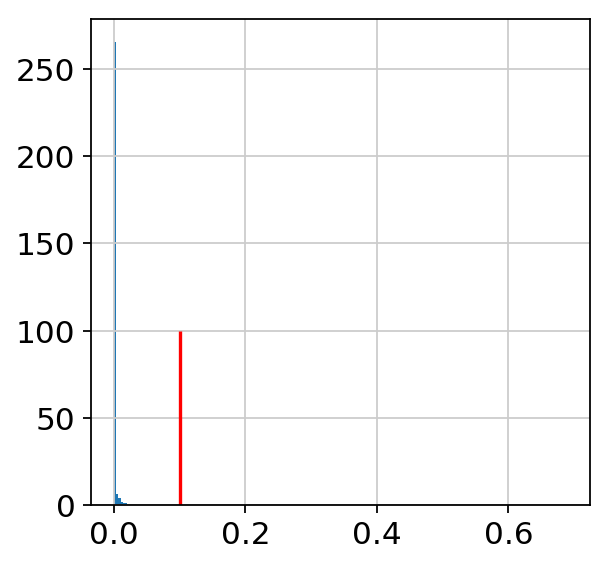

In [19]:
adata.obs['percent_mito_mouse'] = np.ravel(np.sum(adata[:, mito_genes_mouse].X, axis=1)) / np.ravel(np.sum(adata.X, axis=1))
adata.obs['percent_mito_human'] = np.ravel(np.sum(adata[:, mito_genes_human].X, axis=1)) / np.ravel(np.sum(adata.X, axis=1))

plt.hist(adata.obs['percent_mito_mouse'].values,bins=200,density=True)
plt.vlines(0.1,0,100,color='r');
plt.show()
plt.hist(adata.obs['percent_mito_human'].values,bins=200,density=True)
plt.vlines(0.1,0,100,color='r');

## Preprocessing
Decided not to perform highly-variable genes at this time.

In [20]:
adata_ori = adata.copy()

In [24]:
def process1(adata):
    sc.pp.log1p(adata)
    sc.pp.normalize_per_cell(adata)
    return adata

In [25]:
adata = process1(adata)

normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


Going to forgo the highly-variable gene filter here, just going to use all genes that passed my intial filtering.

In [ ]:
# adata.write_h5ad('/myvol/data2/deep/concat.deep.adata.m.and.h.h5ad')

In [ ]:
# I ran this on a separate machine with more memory, requires more because there are so many genes. 
# warnings.filterwarnings('ignore')
# sc.pp.combat(adata)
# warnings.filterwarnings('default')

In [3]:
adata = sc.read_h5ad('/myvol/data2/deep/concat.deep.adata.m.and.h.combatted.h5ad')

In [4]:
sc.pp.scale(adata, max_value=10)

## Dimensionality Reduction and Visualization

In [5]:
sc.pp.pca(adata, n_comps=100)

Note that scikit-learn's randomized PCA might not be exactly reproducible across different computational platforms. For exact reproducibility, choose `svd_solver='arpack'.` This will likely become the Scanpy default in the future.
computing PCA with n_comps = 100
    finished (0:00:35)


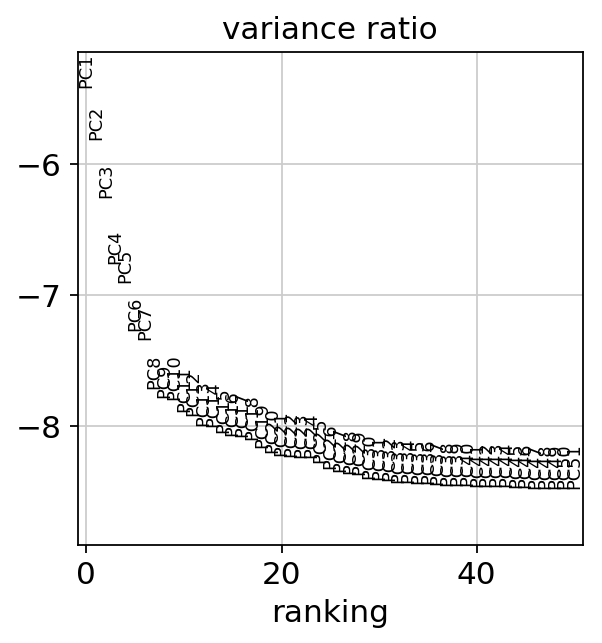

In [6]:
sc.pl.pca_variance_ratio(adata,log=True, n_pcs=50)

In [7]:
warnings.filterwarnings('ignore')
sc.pp.neighbors(adata,n_neighbors=15,n_pcs=40) # numba warning outlined here is not to be of concern: https://github.com/lmcinnes/umap/issues/252
warnings.filterwarnings('default')

computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:19)


In [8]:
sc.tl.umap(adata, spread=5, alpha=2)

computing UMAP


/usr/local/lib/python3.6/dist-packages/umap/umap_.py:1052: RuntimeWarning: divide by zero encountered in power
  return 1.0 / (1.0 + a * x ** (2 * b))


    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:55)


In [9]:
sc.tl.leiden(adata,resolution=2.5)

running Leiden clustering
    finished: found 38 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:44)


In [ ]:
fig, ax = plt.subplots(1,1,figsize=(10,10))
sc.pl.umap(adata,color=['leiden'], ax=ax, size=8, palette=sc.pl.palettes.default_26)

In [ ]:
# scanpy's stupid sort order doesn't work with categorical variables, need to make a separate covariate with a "continuous" binary scale
for batch in adata.obs['batch'].unique():
    adata.obs['batch_%s' % batch] = (adata.obs['batch'] == batch).astype(int)

colorby = adata.obs['batch'].unique()
numplots = len(colorby)
fig, axes = plt.subplots(1,numplots,figsize=(25,25/numplots))
for group, ax in zip(colorby,np.ravel(axes)):
    sc.pl.umap(adata,color='batch_%s' % str(group), sort_order=True, title=str(group), 
               ax=ax, return_fig=False, show=False, legend_loc=None, size=8, palette=['red'])
plt.tight_layout()

We can maybe use 'hg19_RP11-323I15.5', in combination with other factors, as the justification for crap removal:

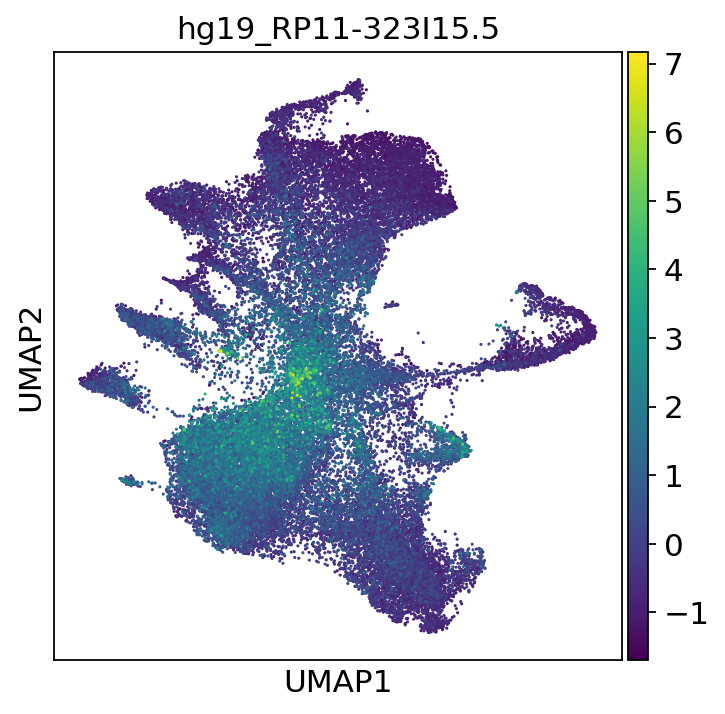

In [12]:
fig, ax = plt.subplots(1,1,figsize=(5,5))
sc.pl.umap(adata,color=['hg19_RP11-323I15.5'], ax=ax, size=8, palette=sc.pl.palettes.default_26)

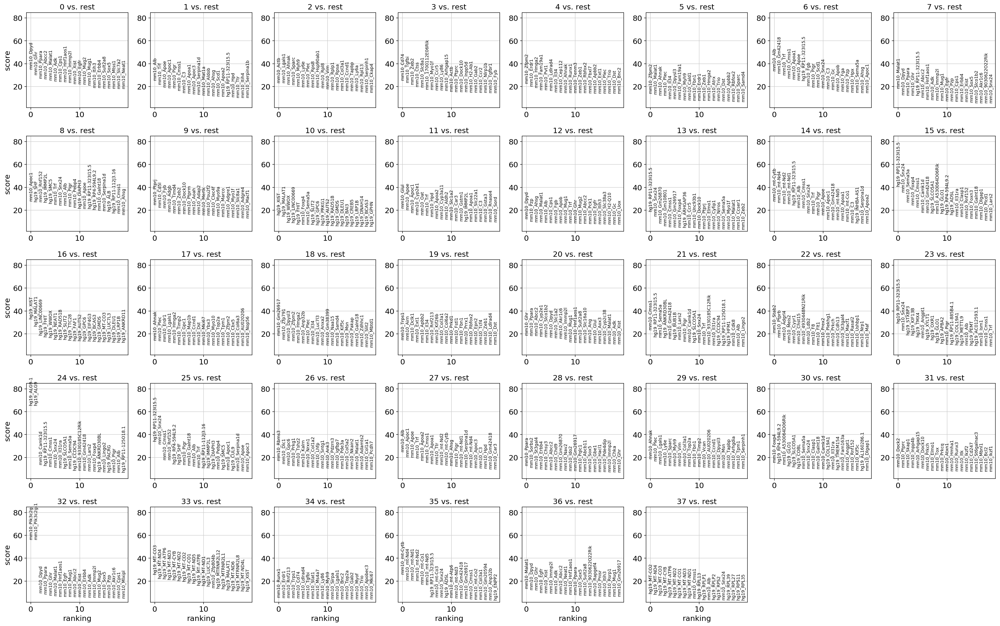

In [13]:
sc.settings.verbosity = 0 
warnings.filterwarnings('ignore')
sc.tl.rank_genes_groups(adata,groupby='leiden')
warnings.filterwarnings('default')
sc.pl.rank_genes_groups(adata, ncols=8)
sc.settings.verbosity = 3

## Filtering for Crap

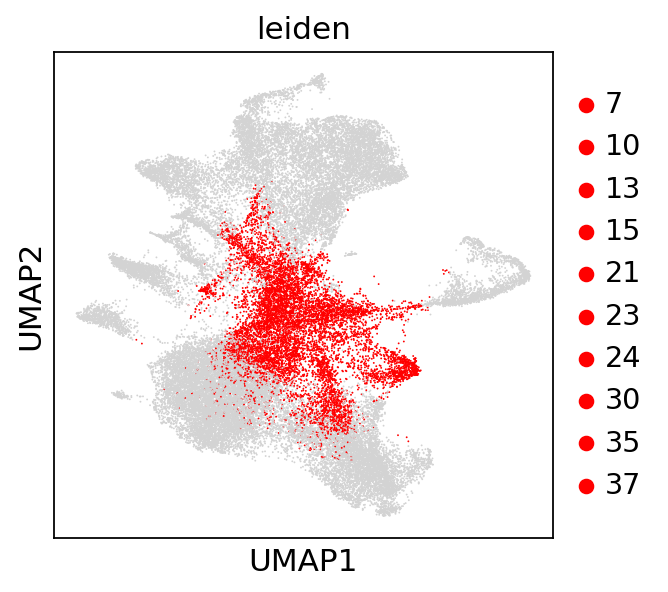

In [19]:
sc.pl.umap(adata,color=['leiden'],groups=['7', '10','13','15', '21', '23', '24', '30', '35', '37'],palette=['red'])

In [20]:
ctdict = dict()
ctdict['Crap'] = [7, 10, 13, 15,21, 23, 24, 30, 35, 37]
ctdict['Other'] = [i for i in range(38) if i not in ctdict['Crap']]
adata.obs['celltype'] = adata.obs['leiden']
for ct in ctdict:
    for clust in ctdict[ct]:
        adata.obs['celltype'].replace(r'^%s$' % str(clust),ct,regex=True, inplace=True)
adata.obs['celltype'] = adata.obs['celltype'].astype('category')

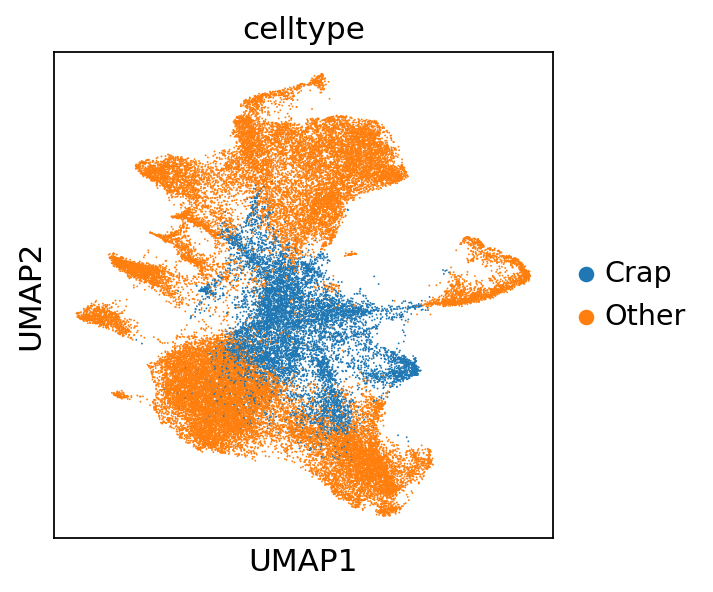

In [21]:
sc.pl.umap(adata,color=['celltype'])

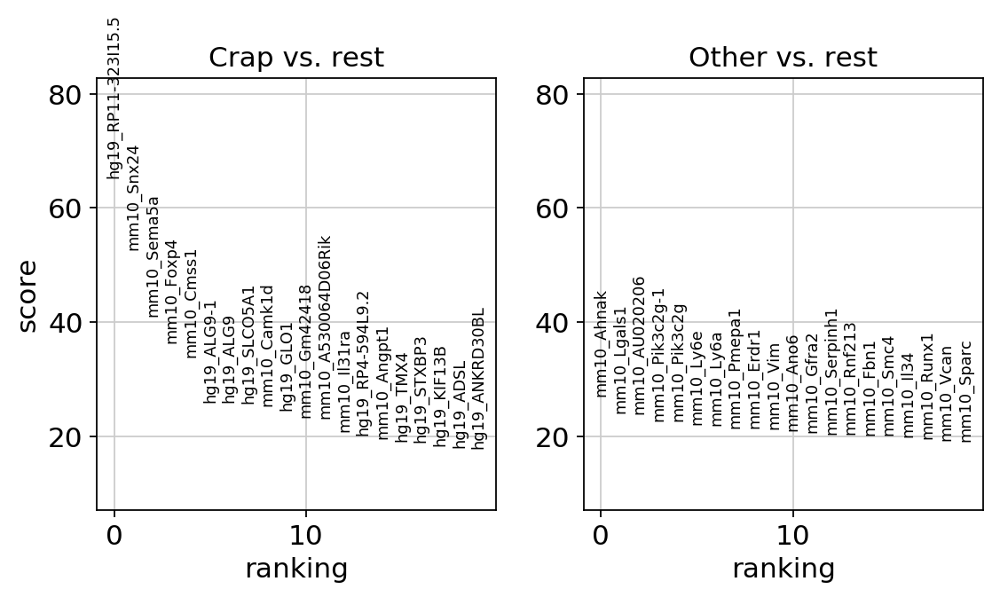

In [37]:
sc.settings.verbosity = 0 
warnings.filterwarnings('ignore')
sc.tl.rank_genes_groups(adata,groupby='celltype')
warnings.filterwarnings('default')
sc.pl.rank_genes_groups(adata)
sc.settings.verbosity = 3

In [38]:
adata.uns['rank_genes_groups']['names']['Crap'][:50]

array(['hg19_RP11-323I15.5', 'mm10_Snx24', 'mm10_Sema5a', 'mm10_Foxp4',
       'mm10_Cmss1', 'hg19_ALG9-1', 'hg19_ALG9', 'hg19_SLCO5A1',
       'mm10_Camk1d', 'hg19_GLO1', 'mm10_Gm42418', 'mm10_A530064D06Rik',
       'mm10_Il31ra', 'hg19_RP4-594L9.2', 'mm10_Angpt1', 'hg19_TMX4',
       'hg19_STXBP3', 'hg19_KIF13B', 'hg19_ADSL', 'hg19_ANKRD30BL',
       'hg19_COL19A1', 'mm10_Lars2', 'hg19_CCDC94', 'hg19_XYLT1',
       'mm10_9330185C12Rik', 'mm10_Dlgap1', 'mm10_Foxn3', 'hg19_OXR1',
       'mm10_Clasp1', 'mm10_Rnf152', 'hg19_COBL', 'mm10_Plcd1',
       'mm10_Skint6', 'mm10_Lingo2', 'hg19_PACRG', 'mm10_AA474408',
       'mm10_Itpr2', 'mm10_Pigr', 'mm10_Spata5', 'hg19_RP11-125O18.1',
       'mm10_Ccser1', 'hg19_AAMDC', 'hg19_BUB1B', 'mm10_Gm26561',
       'hg19_RYR2', 'hg19_XIST', 'mm10_Galnt18', 'hg19_NELL2',
       'hg19_LA16c-444G7.1', 'mm10_Cdk8'], dtype='<U50')

## Regressing for Crap

In [39]:
contam_genes = adata.uns['rank_genes_groups']['names']['Crap']

In [40]:
other_genes = [i for i in adata.var_names if i not in contam_genes]

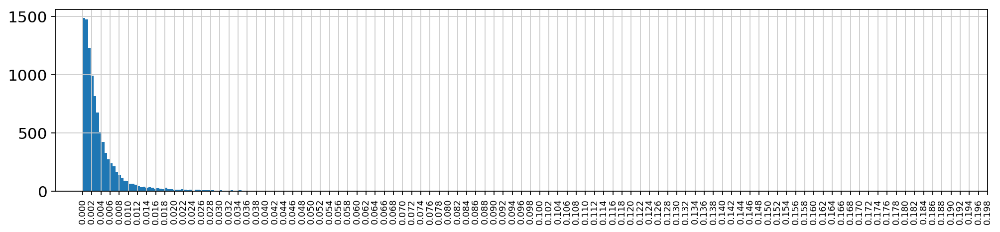

In [26]:
to_plot = list()
rand_pcs = list()
for i in np.random.choice(other_genes,size=100):
    vals = adata.varm['PCs'][adata.var_names.tolist().index(i),:]
    to_plot.append(np.absolute(vals))
    rand_pcs.append(np.argwhere(vals > 0.008))
plt.figure(figsize=(15,3)) 
plt.hist(np.ravel(to_plot),bins=200);
plt.xticks(np.arange(0,0.2,0.002), rotation=90, size=8);

[(5, 19), (1, 15), (0, 14), (99, 12), (2, 10), (85, 10), (14, 9), (48, 9), (50, 9), (51, 9)]


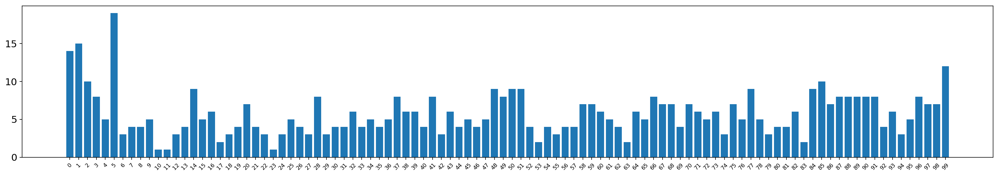

In [27]:
vals, counts = np.unique(np.concatenate(rand_pcs).flatten(),return_counts=True)

plt.figure(figsize=(25,4))
plt.bar(vals, counts);
plt.xticks(ticks=range(100),labels=range(100),rotation=45, size=8)
plt.grid()

print(sorted(list(zip(vals,counts)),key= lambda x: x[1], reverse=True)[:10])

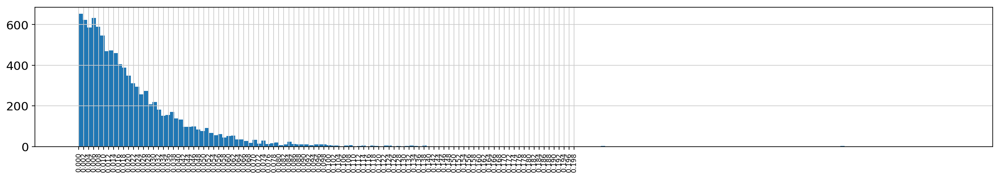

In [31]:
to_plot = list()
contam_pcs = list()
for i in contam_genes:
    vals = adata.varm['PCs'][adata.var_names.tolist().index(i),:]
    to_plot.append(np.absolute(vals))
    contam_pcs.append(np.argwhere(vals > 0.040))
plt.figure(figsize=(20,3)) 
plt.hist(np.ravel(to_plot),bins=200);
plt.xticks(np.arange(0,0.2,0.002), rotation=90, size=8);

[(4, 52), (12, 25), (17, 19), (22, 18), (29, 18), (9, 17), (27, 17), (15, 16), (23, 16), (6, 15)]


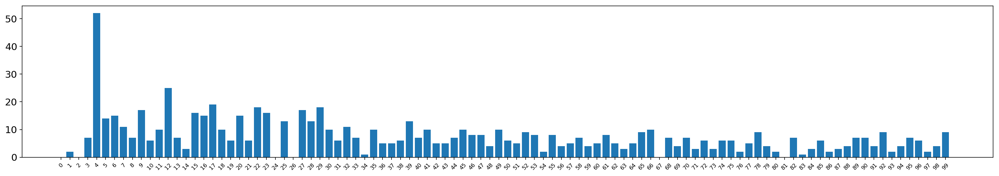

In [32]:
vals, counts = np.unique(np.concatenate(contam_pcs).flatten(),return_counts=True)

plt.figure(figsize=(25,4))
plt.bar(vals, counts);
plt.xticks(ticks=range(100),labels=range(100),rotation=45, size=8)
plt.grid()

print(sorted(list(zip(vals,counts)),key= lambda x: x[1], reverse=True)[:10])

In [43]:
crap_cells = adata.obs_names[adata.obs['celltype'] == 'Crap'].values

In [44]:
keep_cells = np.setdiff1d(adata.obs_names.values, crap_cells)

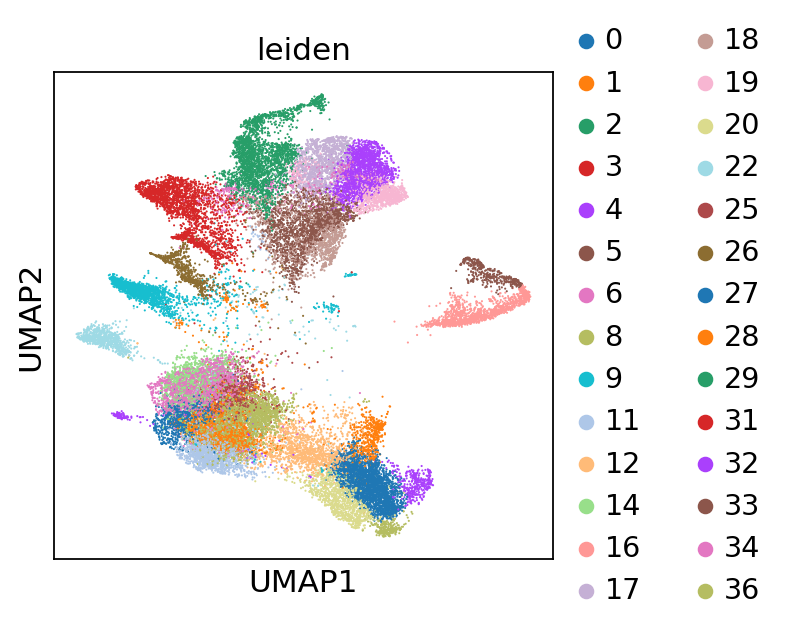

In [45]:
sc.pl.umap(adata[adata.obs['celltype'] != 'Crap'],color='leiden',palette=sc.pl.palettes.vega_20_scanpy)

In [46]:
keep_genes = [i for i in adata.var_names if i not in contam_genes[:50]]

In [47]:
adata = adata[keep_cells].copy()

In [48]:
adata = adata[:,keep_genes].copy()

In [49]:
for i, j in zip([4,12], range(1,3)): # originally I recorded PC at index 5, but that's wrong: my histogram already reports zero-indexed PC location
    adata.obs['contam_pc_%s' % str(j)] = adata.obsm['X_pca'][:,i]

In [50]:
adata.obs.columns

Index(['batch', 'percent_mito_mouse', 'percent_mito_human', 'n_counts',
       'leiden', 'batch_0', 'batch_1', 'batch_2', 'batch_3', 'batch_4',
       'celltype', 'contam_pc_1', 'contam_pc_2'],
      dtype='object')

In [3]:
# adata.write_h5ad('/myvol/data2/deep/concat.deep.adata.m.and.h.combatted.dimred.h5ad')
adata = sc.read_h5ad('/myvol/data2/deep/concat.deep.adata.m.and.h.combatted.dimred.h5ad')

In [4]:
sc.pp.regress_out(adata,keys=['contam_pc_1', 'contam_pc_2'])

regressing out ['contam_pc_1', 'contam_pc_2']
    finished (0:06:26)


In [3]:
# adata.write_h5ad('/myvol/data2/deep/concat.deep.adata.m.and.h.combatted.dimred.regressed.h5ad')
adata = sc.read_h5ad('/myvol/data2/deep/concat.deep.adata.m.and.h.combatted.dimred.regressed.h5ad')

Regressing out recovers a lot of the batch effects, so I'll re-run combat.

In [4]:
warnings.filterwarnings('ignore')
sc.pp.combat(adata)
warnings.filterwarnings('default')

Standardizing Data across genes.

Found 5 batches

Found 0 numerical variables:
	

Fitting L/S model and finding priors

Finding parametric adjustments

Adjusting data



In [3]:
# adata.write_h5ad('/myvol/data2/deep/concat.deep.adata.m.and.h.combatted.dimred.regressed.combatted.h5ad')
adata = sc.read_h5ad('/myvol/data2/deep/concat.deep.adata.m.and.h.combatted.dimred.regressed.combatted.h5ad')

## Dimensionality Reduction and Visualization II

In [4]:
sc.pp.scale(adata, max_value=10)

In [5]:
sc.pp.pca(adata, n_comps=100)

Note that scikit-learn's randomized PCA might not be exactly reproducible across different computational platforms. For exact reproducibility, choose `svd_solver='arpack'.` This will likely become the Scanpy default in the future.
computing PCA with n_comps = 100
    finished (0:00:26)


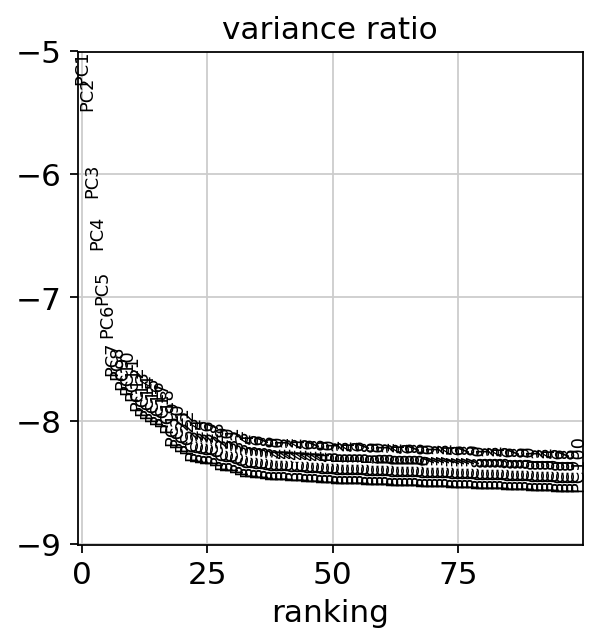

In [6]:
sc.pl.pca_variance_ratio(adata,log=True, n_pcs=100)

In [7]:
warnings.filterwarnings('ignore')
sc.pp.neighbors(adata,n_neighbors=15,n_pcs=35) # numba warning outlined here is not to be of concern: https://github.com/lmcinnes/umap/issues/252
warnings.filterwarnings('default')

computing neighbors
    using 'X_pca' with n_pcs = 35
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:14)


In [20]:
sc.tl.umap(adata)

In [21]:
sc.tl.leiden(adata,resolution=1)

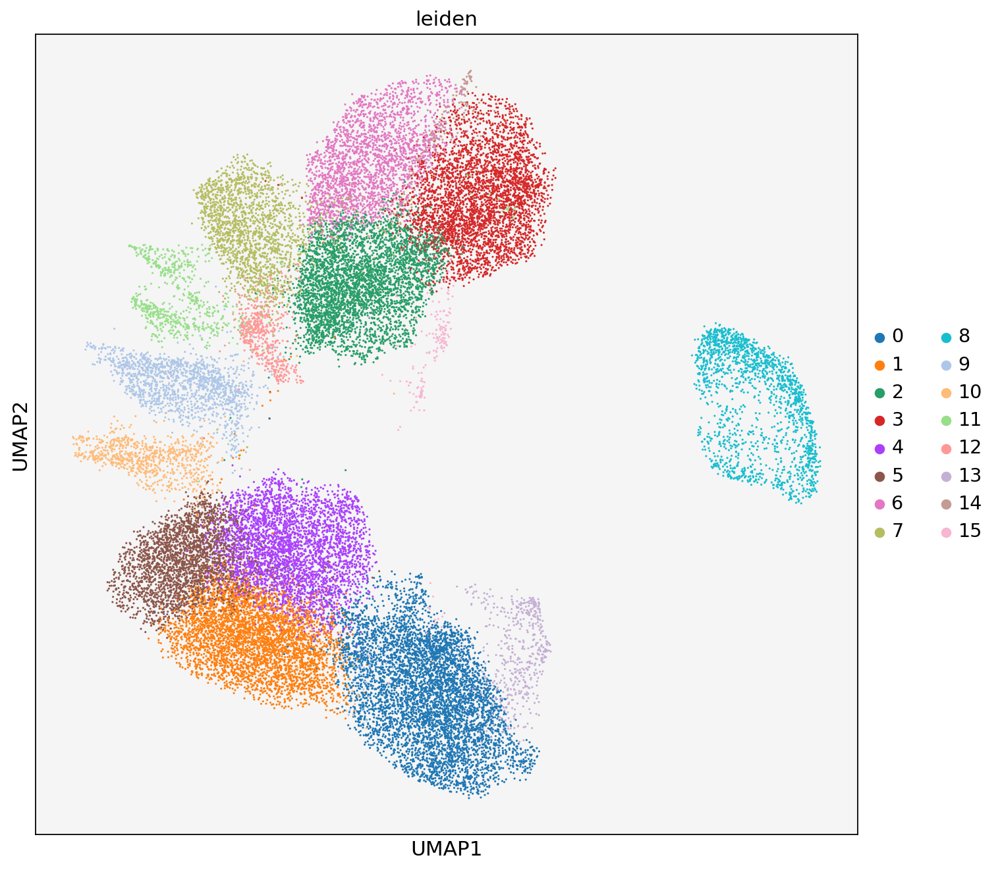

In [21]:
fig, ax = plt.subplots(1,1,figsize=(10,10))
ax.set_facecolor('whitesmoke')
sc.pl.umap(adata,color=['leiden'], ax=ax, size=8, palette=sc.pl.palettes.vega_20_scanpy)

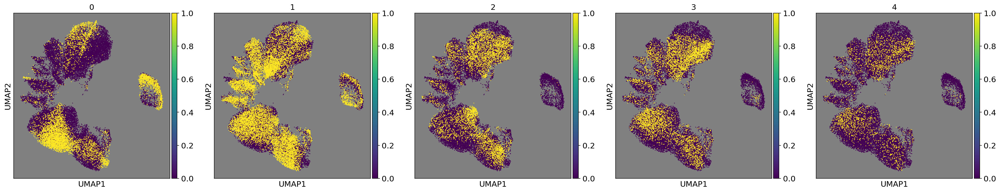

In [219]:
colorby = adata.obs['batch'].unique()
numplots = len(colorby)
fig, axes = plt.subplots(1,numplots,figsize=(25,25/numplots))
for group, ax in zip(colorby,np.ravel(axes)):
    ax.set_facecolor('gray')
    sc.pl.umap(adata,color='batch_%s' % str(group), sort_order=True, title=str(group), 
               ax=ax, return_fig=False, show=False, legend_loc=None, size=8, palette=['red'])
plt.tight_layout()

In [232]:
a, b = np.unique(adata.obs['batch'].values,return_counts=True)
for c, d in zip(a,b):
    print(str(d))

6669
13390
5376
5606
2495


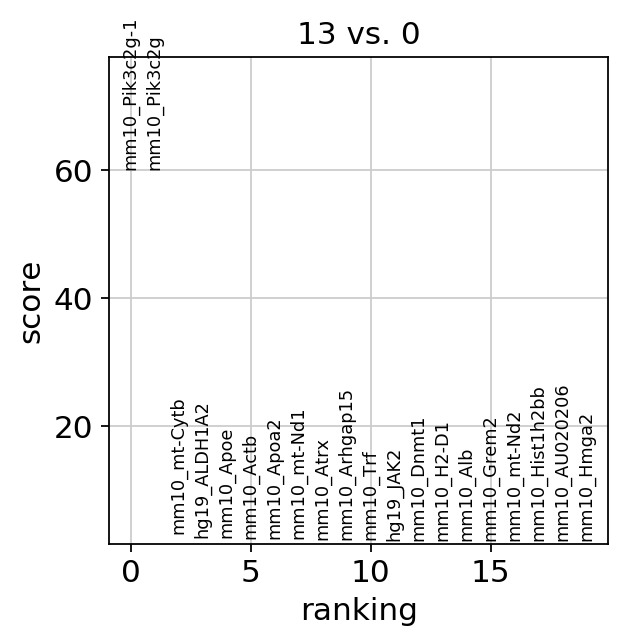

In [24]:
sc.settings.verbosity = 0 
warnings.filterwarnings('ignore')
sc.tl.rank_genes_groups(adata,groupby='leiden', groups=['13'], reference='0')
warnings.filterwarnings('default')
sc.pl.rank_genes_groups(adata)
sc.settings.verbosity = 3

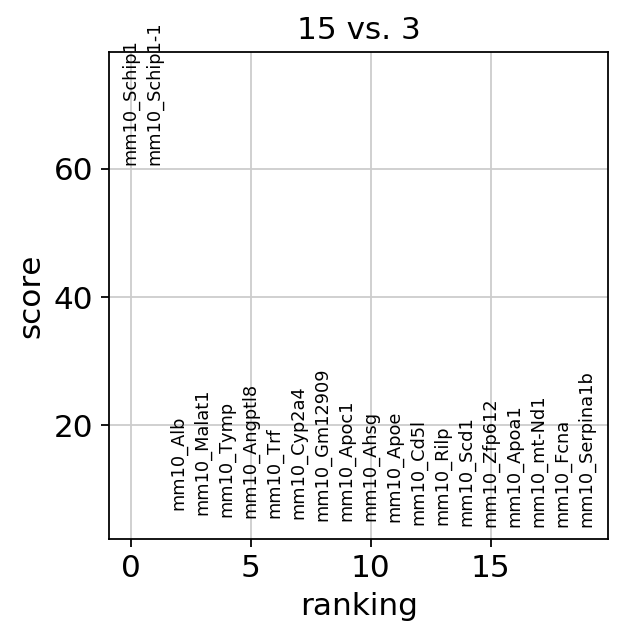

In [25]:
sc.settings.verbosity = 0 
warnings.filterwarnings('ignore')
sc.tl.rank_genes_groups(adata,groupby='leiden', groups=['15'], reference='3')
warnings.filterwarnings('default')
sc.pl.rank_genes_groups(adata)
sc.settings.verbosity = 3

Pretty sure those are garbage cells too.

In [233]:
ctdict = dict()
ctdict['Immune and LSEC'] = [7, 9, 10, 11, 12]
ctdict['MC38'] = [2, 3, 6, 14]
ctdict['Liver'] = [0, 1, 4, 5]
ctdict['Human'] = [8]
ctdict['Pik3c2g'] = [13]
ctdict['Schip1'] = [15]
adata.obs['celltype'] = adata.obs['leiden']
for ct in ctdict:
    for clust in ctdict[ct]:
        adata.obs['celltype'].replace(r'^%s$' % str(clust),ct,regex=True, inplace=True)
adata.obs['celltype'] = adata.obs['celltype'].astype('category')

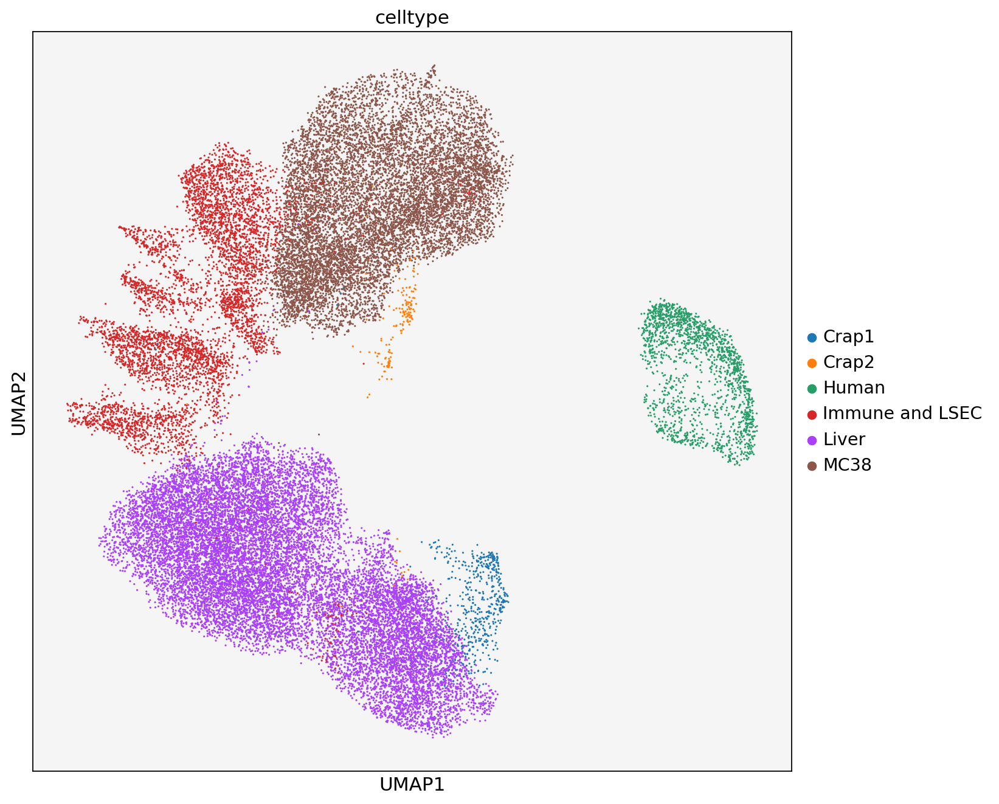

In [22]:
fig, ax = plt.subplots(1,1,figsize=(10,10))
ax.set_facecolor('whitesmoke')
sc.pl.umap(adata,color='celltype', ax=ax, size=8, palette=sc.pl.palettes.vega_20_scanpy)

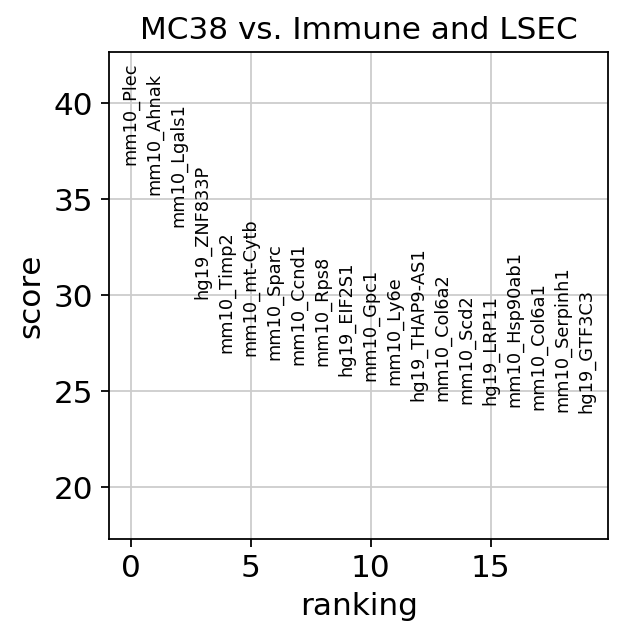

In [11]:
sc.settings.verbosity = 0 
warnings.filterwarnings('ignore')
sc.tl.rank_genes_groups(adata,groupby='celltype', groups=['MC38'], reference='Immune and LSEC')
cancer_genes = adata.uns['rank_genes_groups']['names']['MC38'][:100]
warnings.filterwarnings('default')
sc.pl.rank_genes_groups(adata)
sc.settings.verbosity = 3

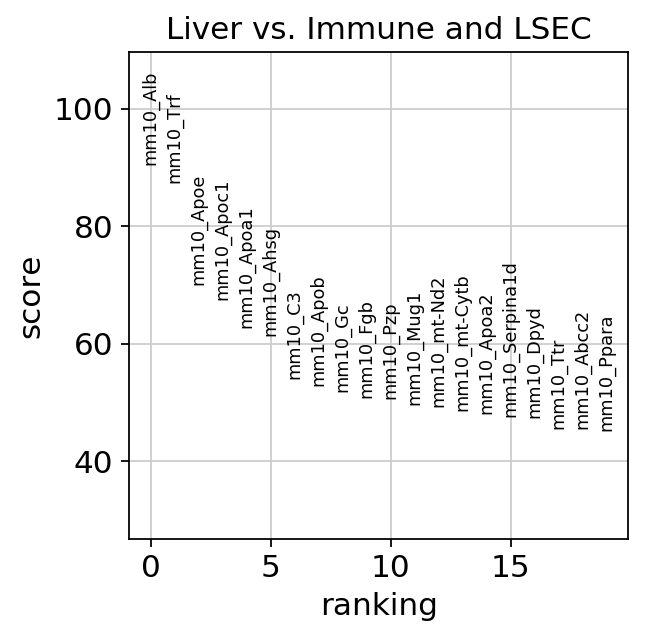

In [12]:
sc.settings.verbosity = 0 
warnings.filterwarnings('ignore')
sc.tl.rank_genes_groups(adata,groupby='celltype', groups=['Liver'], reference='Immune and LSEC')
liver_genes = adata.uns['rank_genes_groups']['names']['Liver'][:100]
warnings.filterwarnings('default')
sc.pl.rank_genes_groups(adata)
sc.settings.verbosity = 3

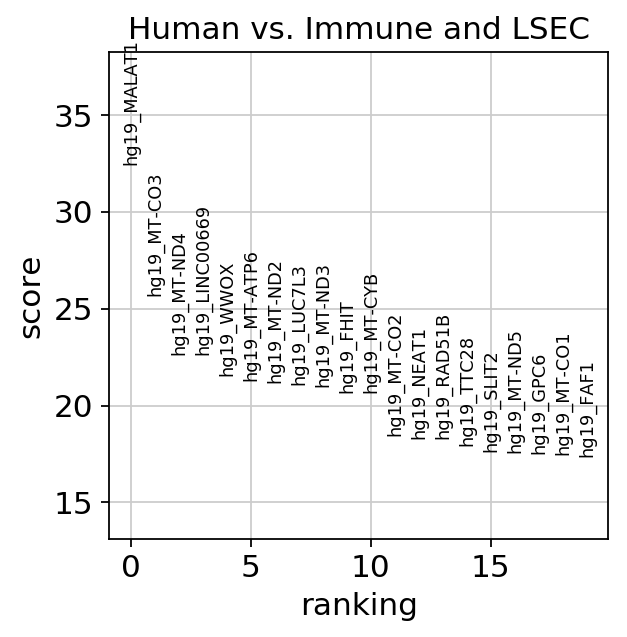

In [13]:
sc.settings.verbosity = 0 
warnings.filterwarnings('ignore')
sc.tl.rank_genes_groups(adata,groupby='celltype', groups=['Human'], reference='Immune and LSEC')
human_genes = adata.uns['rank_genes_groups']['names']['Human'][:100]
warnings.filterwarnings('default')
sc.pl.rank_genes_groups(adata)
sc.settings.verbosity = 3

## Subclustering

In [3]:
# adata.write_h5ad('/myvol/data2/deep/concat.deep.adata.m.and.h.combatted.dimred.regressed.combatted.dimred.h5ad')
adata = sc.read_h5ad('/myvol/data2/deep/concat.deep.adata.m.and.h.combatted.dimred.regressed.combatted.dimred.h5ad')

In [4]:
immune = adata[adata.obs_names[adata.obs['celltype'] == 'Immune and LSEC'].values].copy()

In [5]:
sc.tl.leiden(immune,resolution=2)

running Leiden clustering
    finished: found 19 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:01)


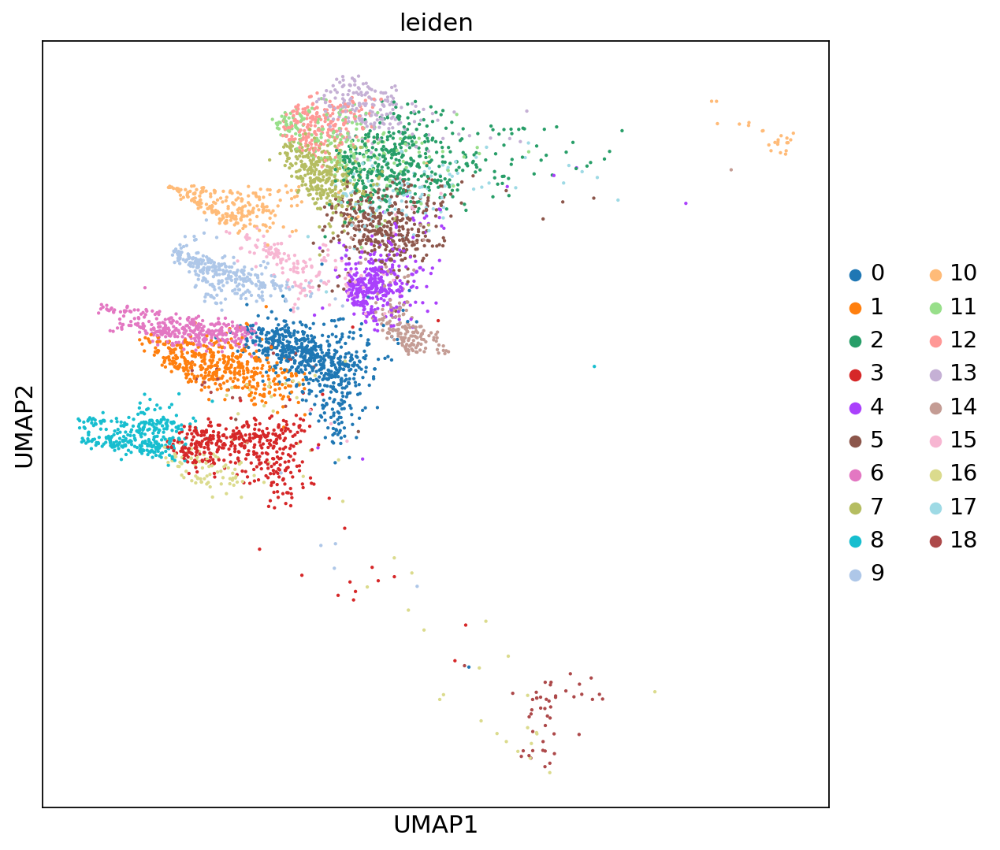

In [6]:
fig, ax = plt.subplots(1,1,figsize=(8,8))
sc.pl.umap(immune, color='leiden', size=15, ax=ax, palette=sc.pl.palettes.default_20)

In [7]:
ctdict = dict()
ctdict['ct0'] = [2, 5, 7, 11, 12, 13, 17]
ctdict['ct1'] = [0, 1, 6]
ctdict['ct2'] = [3, 7, 8, 16, 18]
ctdict['ct3'] = [4, 14]
ctdict['ct4'] = [9]
ctdict['ct5'] = [10]
ctdict['ct6'] = [15]
# ctdict['ct7'] = [18]
immune.obs['celltype'] = immune.obs['leiden']
for ct in ctdict:
    for clust in ctdict[ct]:
        immune.obs['celltype'].replace(r'^%s$' % str(clust),ct,regex=True, inplace=True)
immune.obs['celltype'] = immune.obs['celltype'].astype('category')

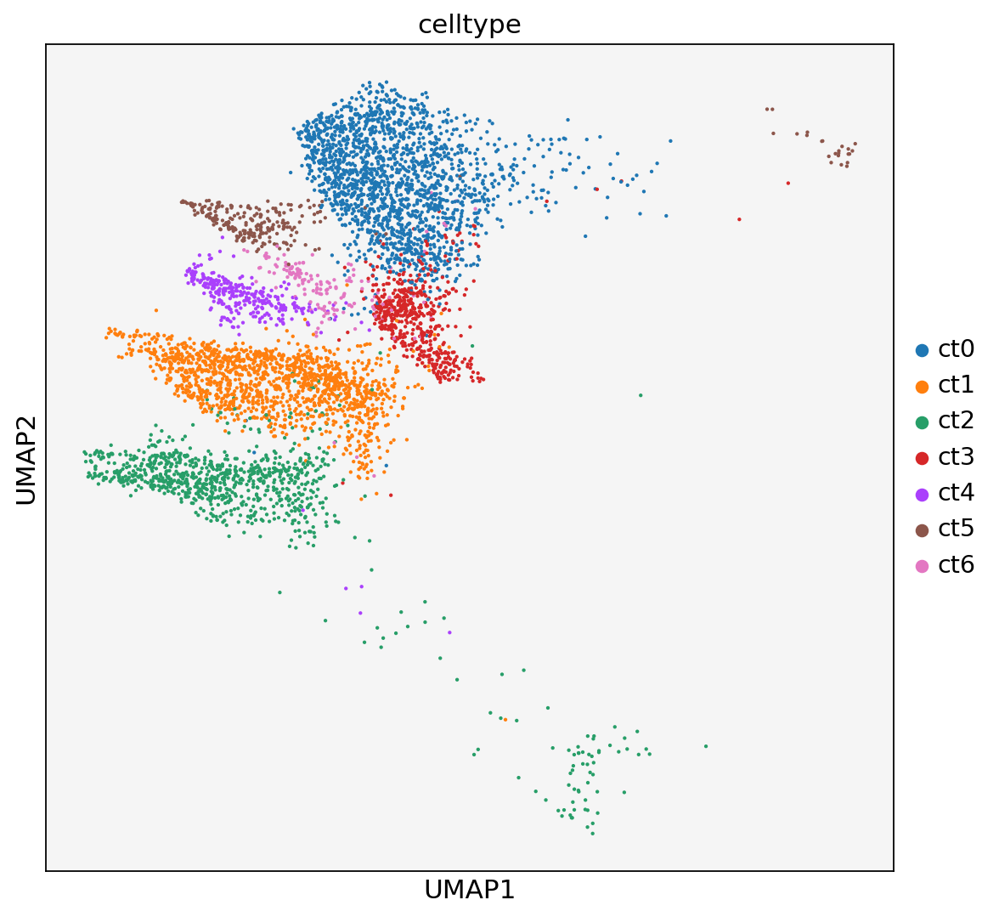

In [8]:
fig, ax = plt.subplots(1,1,figsize=(8,8))
ax.set_facecolor('whitesmoke')
sc.pl.umap(immune, color='celltype', size=15, ax=ax, palette=sc.pl.palettes.default_20)

In [14]:
contam_genes = np.concatenate([liver_genes, cancer_genes, np.array([i for i in immune.var_names if i.startswith('hg19_')])])

In [15]:
keep_genes = [i for i in immune.var_names if i not in contam_genes]

In [16]:
immune = immune[:,keep_genes].copy()

## Highly Variable Genes Extraction Functions

In [22]:
def hv_run(adata,min_mean=0.0125, min_disp=0.5, max_mean=3):    # Extract out highly variable genes, but don't subset just yet.
    hv_adata = adata.copy()
    sc.pp.highly_variable_genes(hv_adata, flavor='cell_ranger',inplace=True, 
                                min_mean=min_mean, 
                                min_disp=min_disp, 
                                max_mean=max_mean,
                                n_bins=500)
    return hv_adata

In [23]:
hv_adata = hv_check(immune)

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


In [24]:
gate1 = np.array([(4e-3, 1e-1), (4e-3, 1e1), (1, 1e1), (1, 1e-1)])

In [25]:
def hv_plot(hv_adata, gate=None):
    plt.figure(figsize=(7,7))
    plt.plot(hv_adata.var['means'].values,hv_adata.var['dispersions_norm'].values,linewidth=0, marker='.',markersize=0.5, color='b');
    plt.minorticks_on()
    plt.xscale('log')
    plt.yscale('log')
    plt.grid(True,which='both',axis='both')
    ax = plt.gca()
    if type(gate) != type(None):
        gatepatch = patches.Polygon(gate,linewidth=1,edgecolor='teal',facecolor='turquoise',alpha=0.5)
        ax.add_patch(gatepatch);

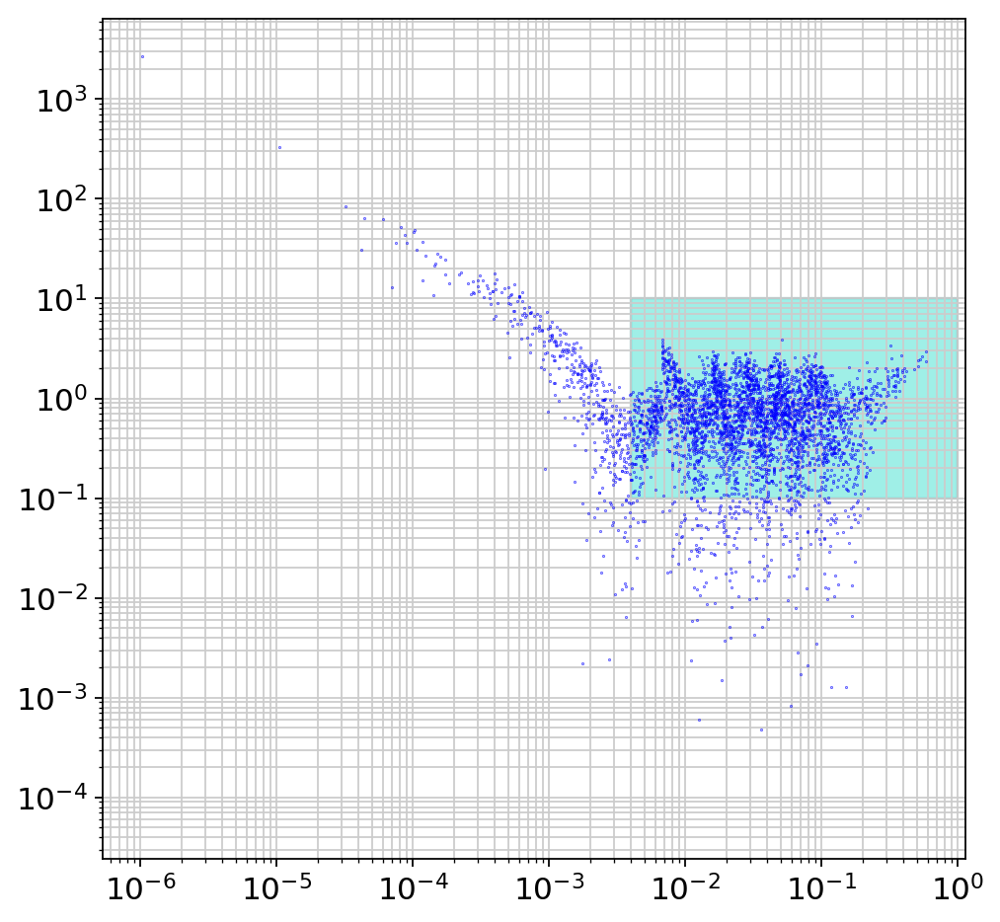

In [26]:
hv_plot(hv_adata, gate=gate1)

In [40]:
def hv_genes(hv_adata, gate, adata=None):
    '''
    Receive boolean for genes in gate or new subsetted adata object, if provided.
    '''
    genes = list()
    means = hv_adata.var['means'].values
    disps = hv_adata.var['dispersions_norm'].values
    pointsmap = map(Point,means,disps)
    polygon = Polygon(gate1)
    for i in pointsmap:
        genes.append(polygon.contains(i))
    if type(adata) != type(None):
        adata = adata[:,genes].copy()
        return adata
    else:
        return genes

In [41]:
genes = hv_genes(hv_adata, gate1)

In [42]:
sum(genes)

3336

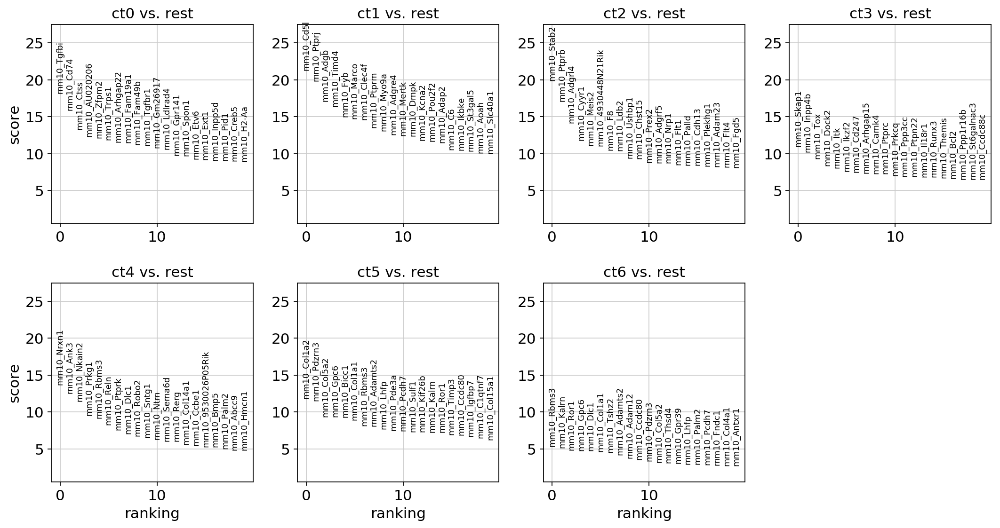

In [626]:
sc.settings.verbosity = 0 
warnings.filterwarnings('ignore')
sc.tl.rank_genes_groups(immune,groupby='celltype', n_genes=300)
warnings.filterwarnings('default')
sc.pl.rank_genes_groups(immune)
sc.settings.verbosity = 3

In [634]:
list(map(lambda x: print(x[5:]),immune.uns['rank_genes_groups']['names']['ct6'][:30]));

Rbms3
Kalrn
Ror1
Gpc6
Dlc1
Col1a1
Tshz2
Adamts2
Adam12
Ccdc80
Pdzrn3
Col5a2
Thsd4
Gpr39
Lhfp
Palm2
Pcdh7
Fndc1
Col4a1
Antxr1
Sulf1
Atp8b1
Ppp2r2b
Casp4
Tmtc1
Epha3
Col4a2
Ascc3
Col1a2
Cntnap2


In [647]:
immune_sub1 = immune[(immune.obs['celltype'] == 'ct4') | 
                    (immune.obs['celltype'] == 'ct5') | 
                    (immune.obs['celltype'] == 'ct6')].copy()

In [649]:
sc.tl.leiden(immune_sub1,resolution=0.5)

running Leiden clustering
    finished: found 4 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


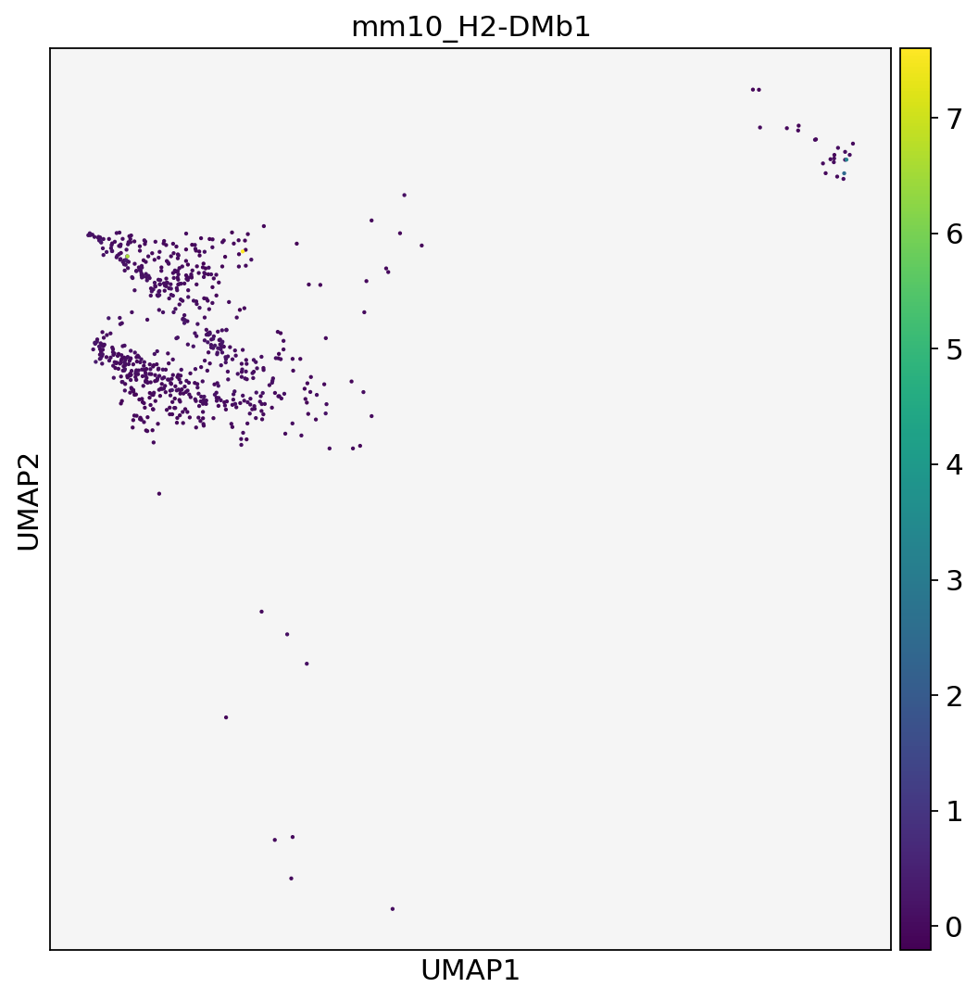

In [687]:
fig, ax = plt.subplots(1,1,figsize=(8,8))
ax.set_facecolor('whitesmoke')
sc.pl.umap(immune_sub1, color='mm10_H2-DMb1', size=15, ax=ax, palette=sc.pl.palettes.default_20)

In [718]:
immune_sub3 = immune_sub1[(immune_sub1.obs['leiden'] == '0')].copy()

In [719]:
sc.tl.leiden(immune_sub3,resolution=0.3)

running Leiden clustering
    finished: found 2 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


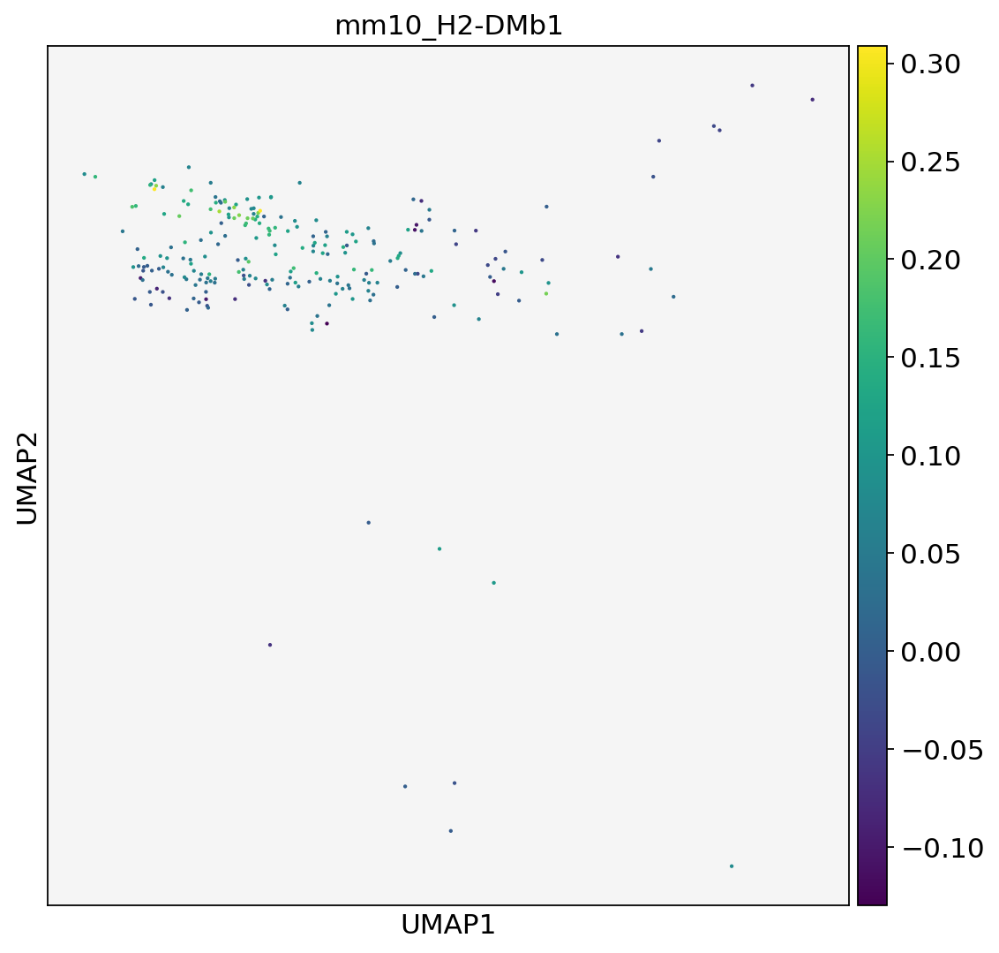

In [720]:
fig, ax = plt.subplots(1,1,figsize=(8,8))
ax.set_facecolor('whitesmoke')
sc.pl.umap(immune_sub3, color='mm10_H2-DMb1', size=15, ax=ax, palette=sc.pl.palettes.default_20)

In [721]:
def hv_check(adata,min_mean=0.0125, min_disp=0.5, max_mean=3):    # Extract out highly variable genes, but don't subset just yet.
    hv_adata = adata.copy()
    sc.pp.highly_variable_genes(hv_adata, flavor='cell_ranger',inplace=True, 
                                min_mean=min_mean, 
                                min_disp=min_disp, 
                                max_mean=max_mean,
                                n_bins=500)
    return hv_adata

In [722]:
hv_adata = hv_check(immune_sub3)

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


In [727]:
gate1 = np.array([(1e-2, 6e-1), (1e-2, 1e1), (3, 1e1), (3, 6e-1)])

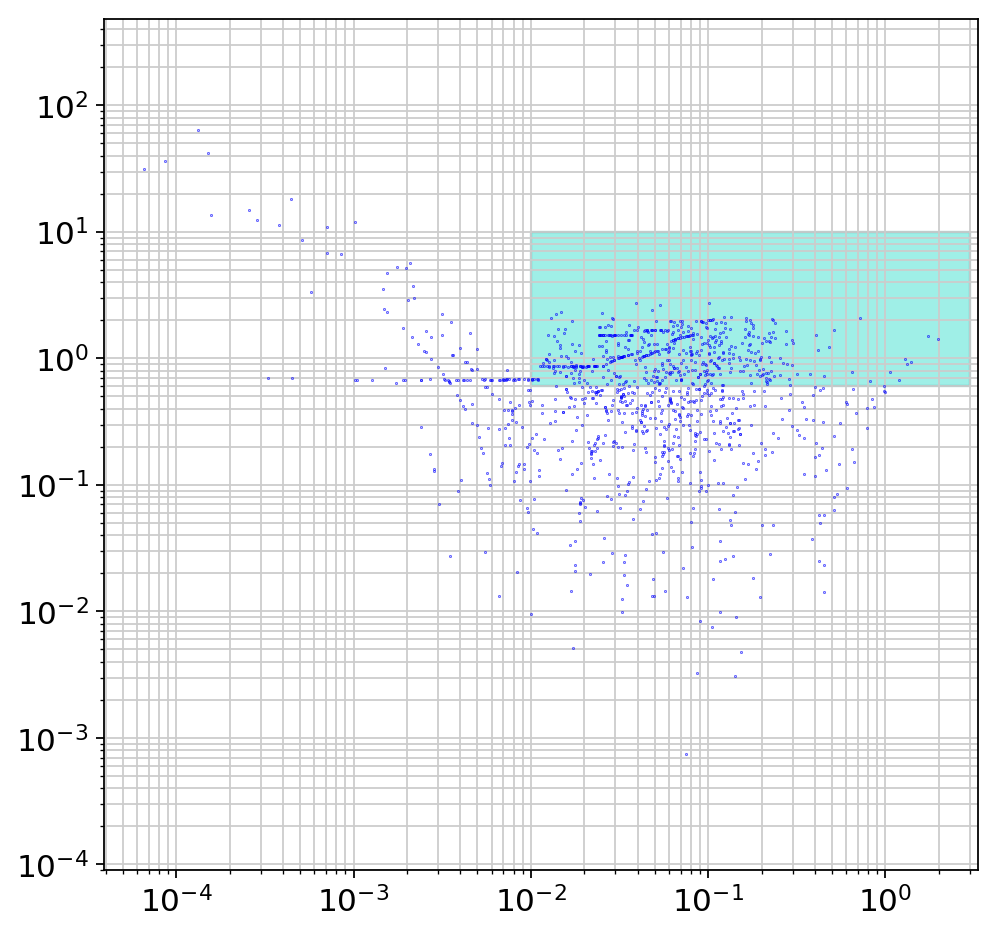

In [728]:
plt.figure(figsize=(7,7))
plt.plot(hv_adata.var['means'].values,hv_adata.var['dispersions_norm'].values,linewidth=0, marker='.',markersize=0.5, color='b');
plt.minorticks_on()
plt.xscale('log')
plt.yscale('log')
plt.grid(True,which='both',axis='both')
ax = plt.gca()

gatepatch = patches.Polygon(gate1,linewidth=1,edgecolor='teal',facecolor='turquoise',alpha=0.5)
ax.add_patch(gatepatch);

In [729]:
genes = list()
means = hv_adata.var['means'].values
disps = hv_adata.var['dispersions_norm'].values
pointsmap = map(Point,means,disps)
polygon = Polygon(gate1)
for i in tqdm(pointsmap,total=len(means)):
    genes.append(polygon.contains(i))

In [730]:
sum(genes)

544

In [731]:
immune_sub3.var_names[genes]

Index(['mm10_Prex2', 'mm10_Ptpn18', 'mm10_Neurl3', 'mm10_Npas2', 'mm10_Il18r1',
       'mm10_Stat4', 'mm10_Hecw2', 'mm10_Clk1', 'mm10_Cflar', 'mm10_Pard3b',
       ...
       'mm10_Dock8', 'mm10_Glis3', 'mm10_Prkg1', 'mm10_Blnk', 'mm10_Pik3ap1',
       'mm10_R3hcc1l', 'mm10_Calhm2', 'mm10_Atrnl1', 'mm10_Grk5',
       'mm10_Csf2ra'],
      dtype='object', name='index', length=544)

In [ ]:
immune_sub3[:,genes]

In [ ]:
immune_sub3 = immune_sub3[:,genes].copy()

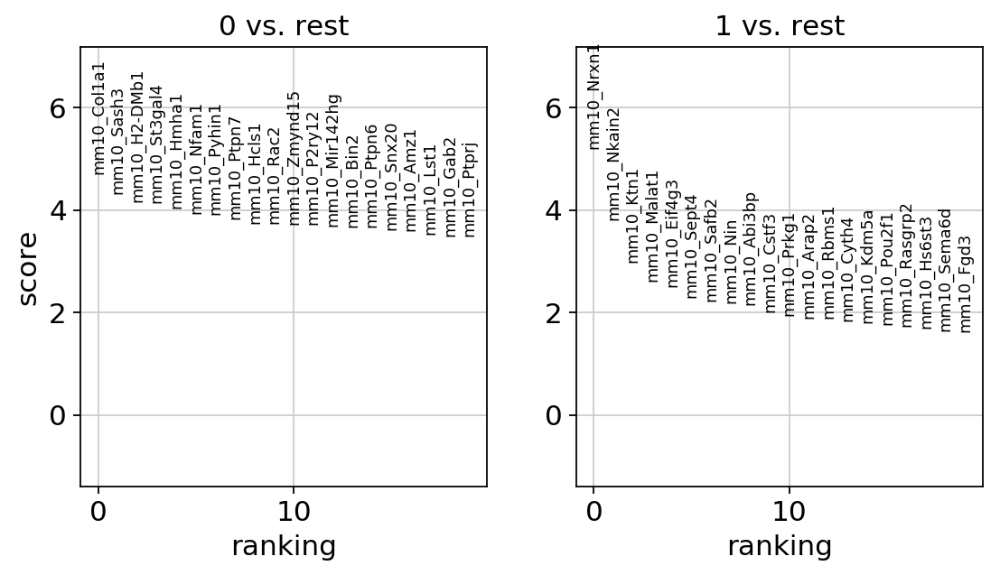

In [681]:
sc.settings.verbosity = 0 
warnings.filterwarnings('ignore')
sc.tl.rank_genes_groups(immune_sub3,groupby='leiden', n_genes=300)
warnings.filterwarnings('default')
sc.pl.rank_genes_groups(immune_sub3)
sc.settings.verbosity = 3

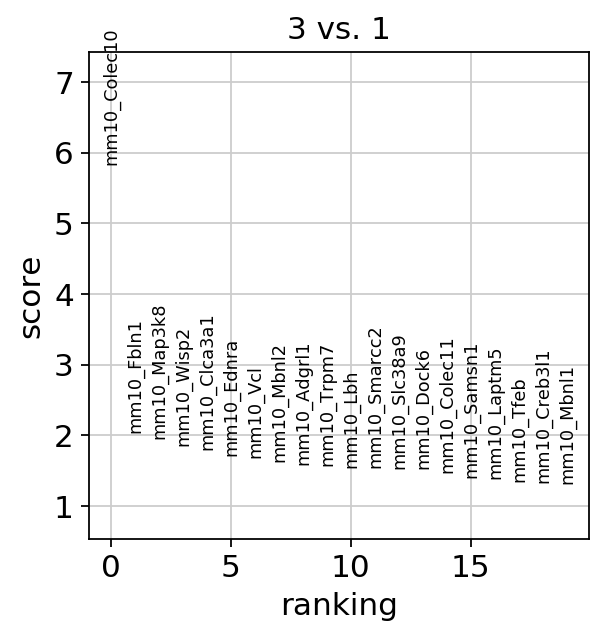

In [404]:
sc.settings.verbosity = 0 
warnings.filterwarnings('ignore')
sc.tl.rank_genes_groups(immune_sub1,groupby='leiden', groups=['3'], reference='1')
warnings.filterwarnings('default')
sc.pl.rank_genes_groups(immune_sub1)
sc.settings.verbosity = 3

In [574]:
immune_sub2 = immune[(immune.obs['celltype'] == 'ct3')].copy()# | 
#                     (immune.obs['celltype'] == 'ct0')].copy()

In [575]:
sc.tl.leiden(immune_sub2,resolution=0.3)

running Leiden clustering
    finished: found 2 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


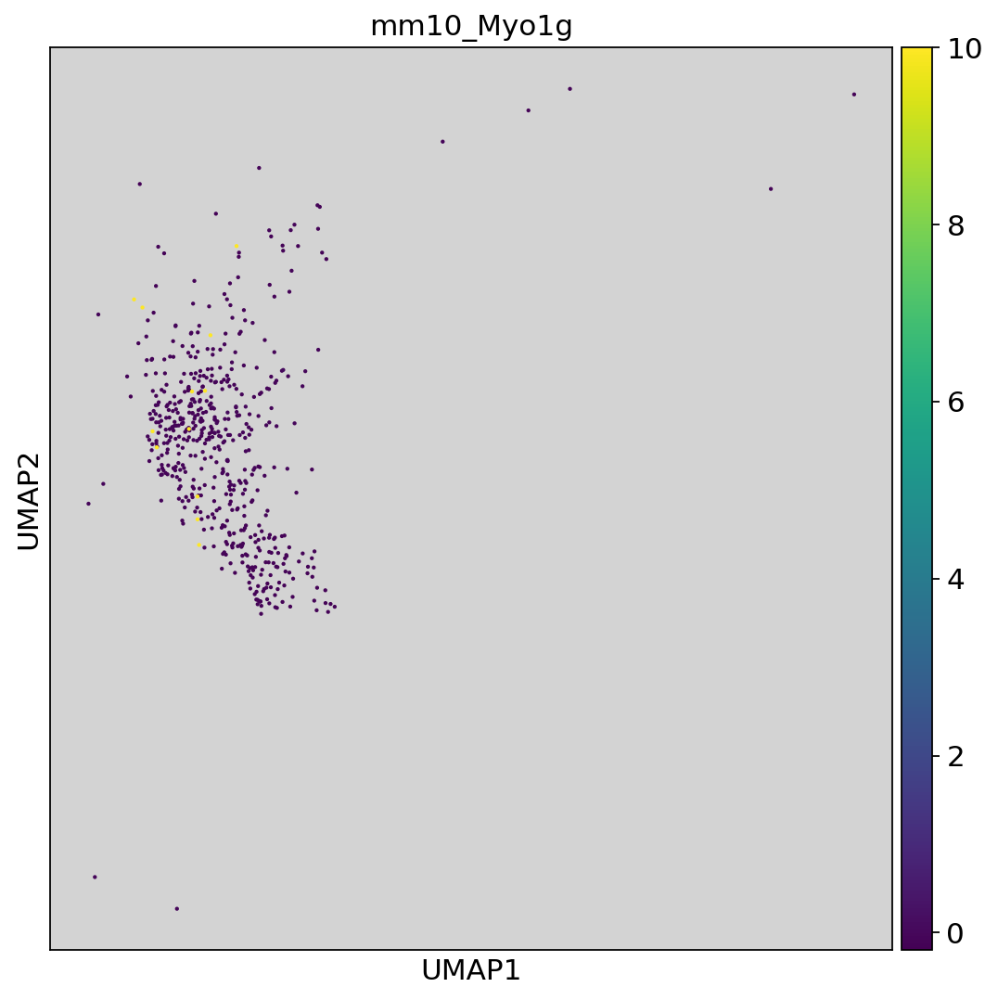

In [622]:
fig, ax = plt.subplots(1,1,figsize=(8,8))
ax.set_facecolor('lightgray')
sc.pl.umap(immune_sub2, color='mm10_Myo1g', size=15, ax=ax, palette=sc.pl.palettes.default_20)

In [129]:
def hv_check(adata,min_mean=0.0125, min_disp=0.5, max_mean=3):    # Extract out highly variable genes, but don't subset just yet.
    hv_adata = adata.copy()
    sc.pp.highly_variable_genes(hv_adata, flavor='cell_ranger',inplace=True, 
                                min_mean=min_mean, 
                                min_disp=min_disp, 
                                max_mean=max_mean,
                                n_bins=500)
    return hv_adata

In [578]:
hv_adata = hv_check(immune_sub2)

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


In [579]:
gate1 = np.array([(1e-1, 5e-1), (5e-3, 1e1), (2, 1e1), (2, 5e-1)])

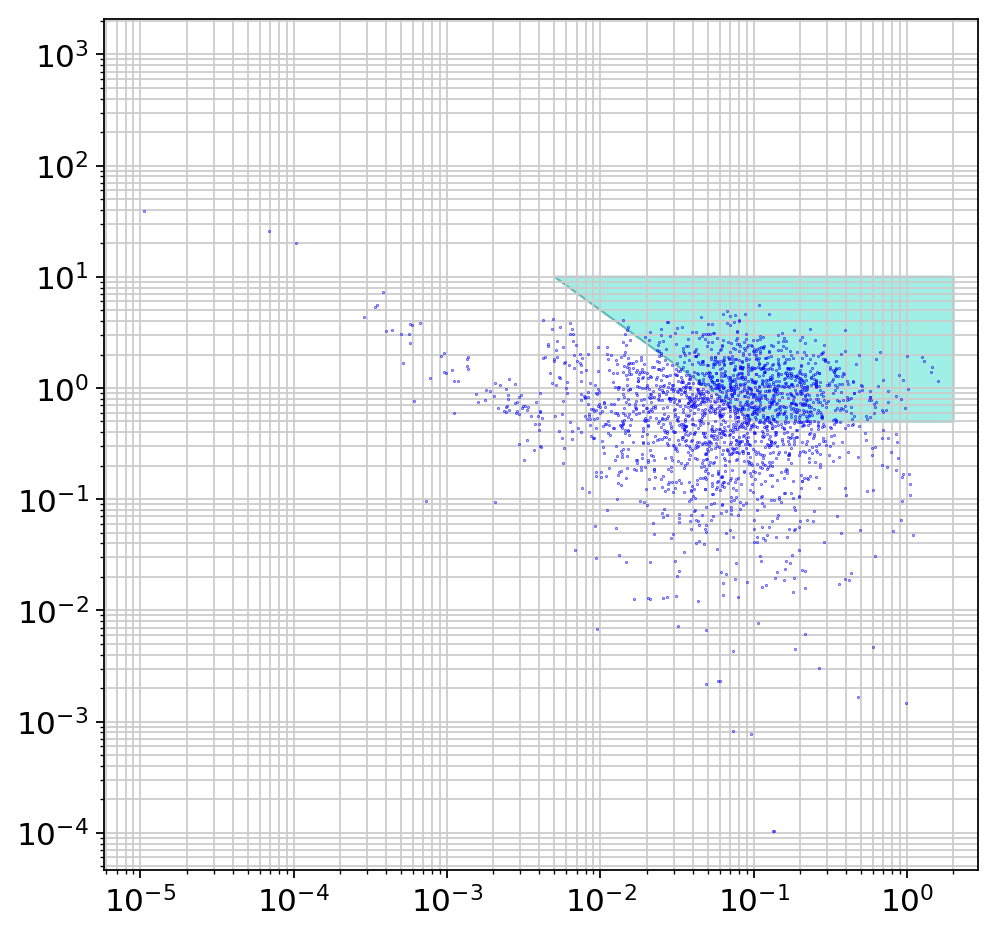

In [580]:
plt.figure(figsize=(7,7))
plt.plot(hv_adata.var['means'].values,hv_adata.var['dispersions_norm'].values,linewidth=0, marker='.',markersize=0.5, color='b');
plt.minorticks_on()
plt.xscale('log')
plt.yscale('log')
plt.grid(True,which='both',axis='both')
ax = plt.gca()

gatepatch = patches.Polygon(gate1,linewidth=1,edgecolor='teal',facecolor='turquoise',alpha=0.5)
ax.add_patch(gatepatch);

In [581]:
genes = list()
means = hv_adata.var['means'].values
disps = hv_adata.var['dispersions_norm'].values
pointsmap = map(Point,means,disps)
polygon = Polygon(gate1)
for i in tqdm(pointsmap,total=len(means)):
    genes.append(polygon.contains(i))

/usr/local/lib/python3.6/dist-packages/tqdm/__init__.py:27: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  TqdmDeprecationWarning)


In [582]:
sum(genes)

585

In [583]:
immune_sub2 = immune_sub2[:,genes].copy()

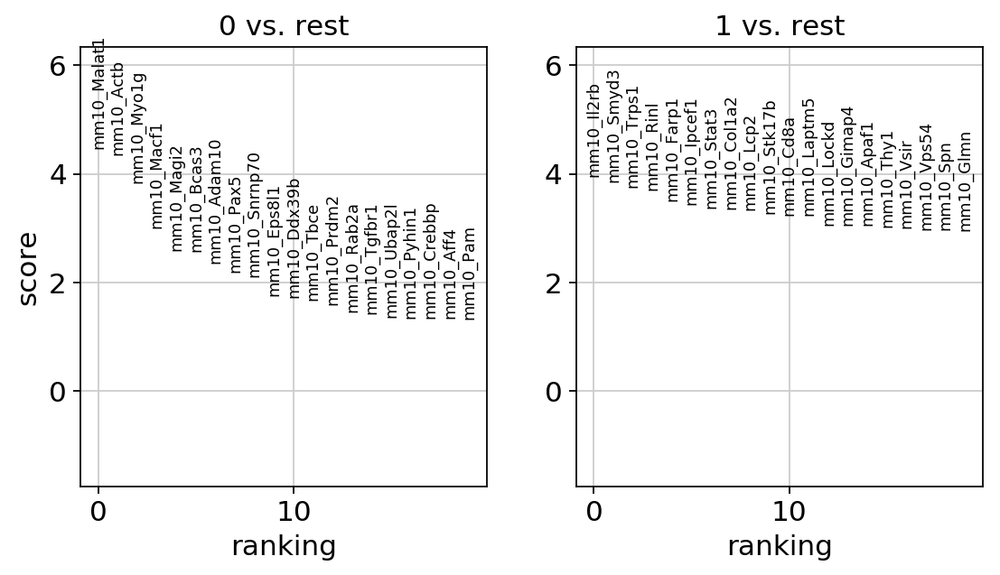

In [584]:
sc.settings.verbosity = 0 
warnings.filterwarnings('ignore')
sc.tl.rank_genes_groups(immune_sub2,groupby='leiden', n_genes=300)
warnings.filterwarnings('default')
sc.pl.rank_genes_groups(immune_sub2)
sc.settings.verbosity = 3

In [606]:
hv_adata = hv_check(immune_sub2[immune_sub2.obs['leiden'] == '0'])

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


In [607]:
gate1 = np.array([(1e-1, 1e-3), (1e-1, 1e0), (2, 1e0), (2, 1e-3)])

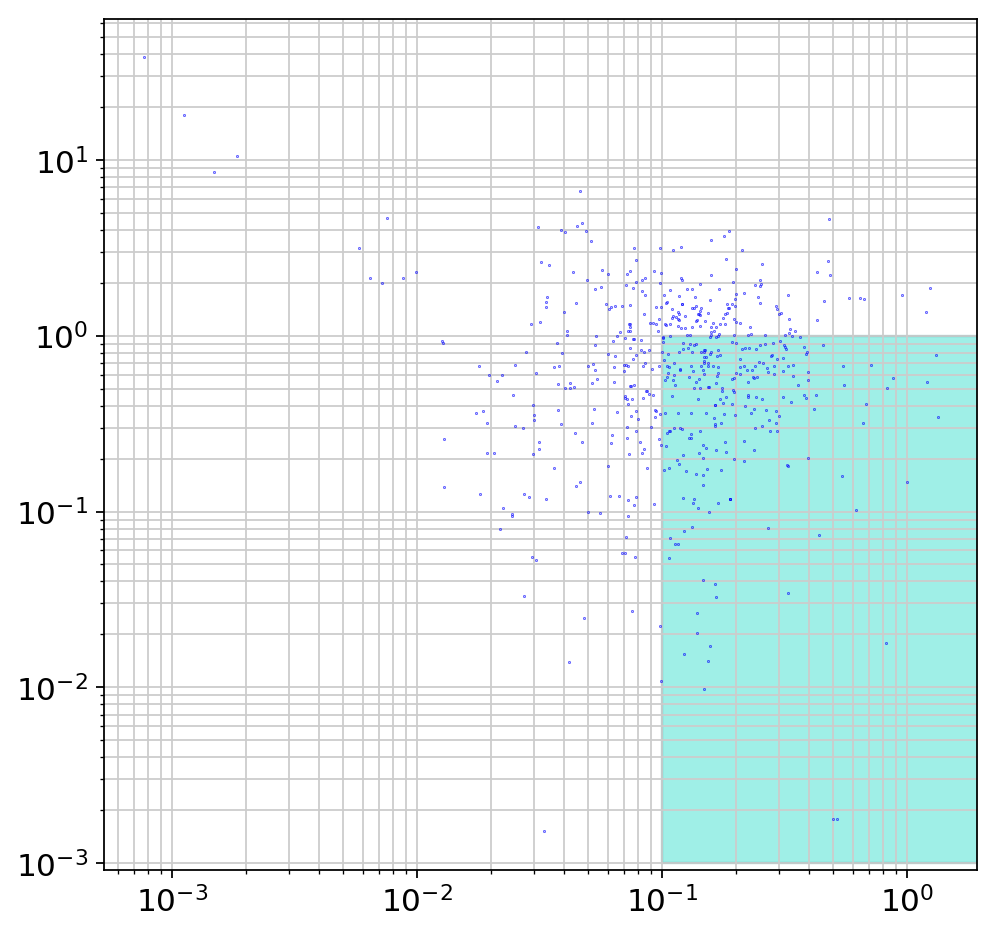

In [608]:
plt.figure(figsize=(7,7))
plt.plot(hv_adata.var['means'].values,hv_adata.var['dispersions_norm'].values,linewidth=0, marker='.',markersize=0.5, color='b');
plt.minorticks_on()
plt.xscale('log')
plt.yscale('log')
plt.grid(True,which='both',axis='both')
ax = plt.gca()

gatepatch = patches.Polygon(gate1,linewidth=1,edgecolor='teal',facecolor='turquoise',alpha=0.5)
ax.add_patch(gatepatch);

In [609]:
clust0_genes = list()
means = hv_adata.var['means'].values
disps = hv_adata.var['dispersions_norm'].values
pointsmap = map(Point,means,disps)
polygon = Polygon(gate1)
for i in tqdm(pointsmap,total=len(means)):
    clust0_genes.append(polygon.contains(i))

/usr/local/lib/python3.6/dist-packages/tqdm/__init__.py:27: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  TqdmDeprecationWarning)


In [610]:
sum(clust0_genes)

233

In [611]:
hv_adata = hv_check(immune_sub2[immune_sub2.obs['leiden'] == '1'])

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


In [612]:
gate1 = np.array([(3e-1, 1e-3), (3e-1, 1e0), (3, 1e0), (3, 1e-3)])

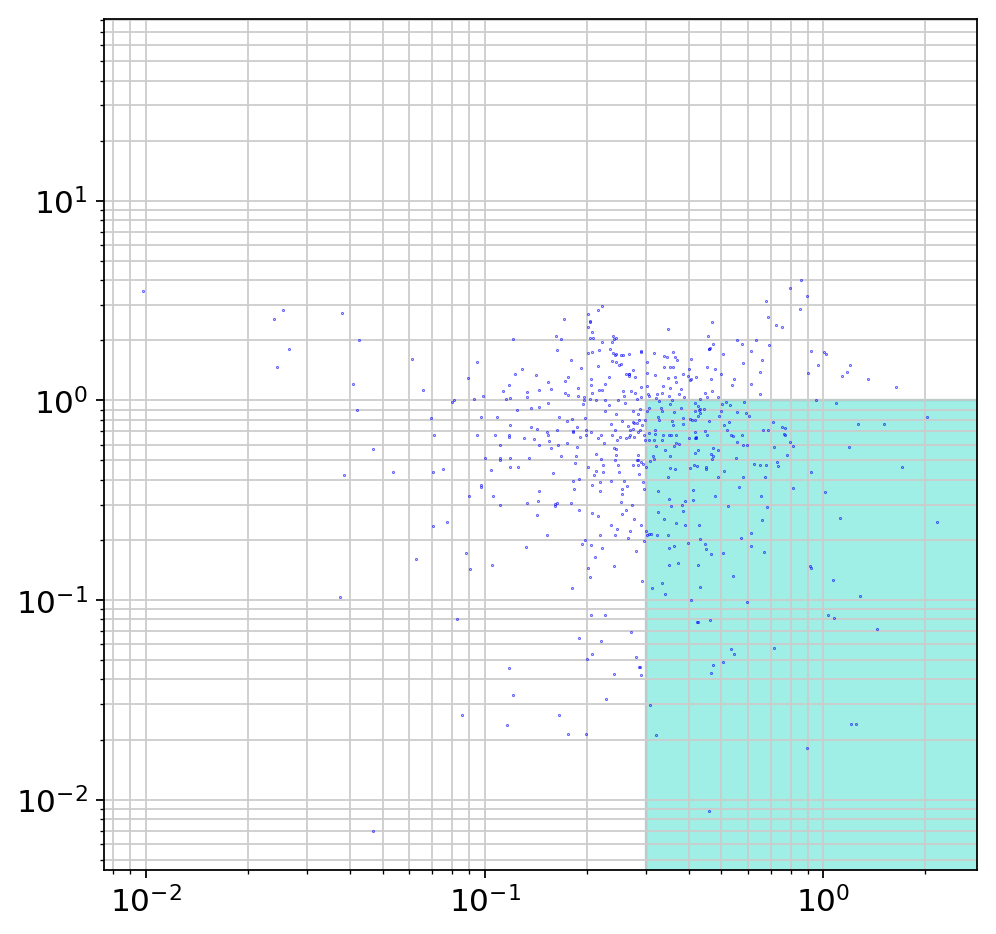

In [613]:
plt.figure(figsize=(7,7))
plt.plot(hv_adata.var['means'].values,hv_adata.var['dispersions_norm'].values,linewidth=0, marker='.',markersize=0.5, color='b');
plt.minorticks_on()
plt.xscale('log')
plt.yscale('log')
plt.grid(True,which='both',axis='both')
ax = plt.gca()

gatepatch = patches.Polygon(gate1,linewidth=1,edgecolor='teal',facecolor='turquoise',alpha=0.5)
ax.add_patch(gatepatch);

In [614]:
clust1_genes = list()
means = hv_adata.var['means'].values
disps = hv_adata.var['dispersions_norm'].values
pointsmap = map(Point,means,disps)
polygon = Polygon(gate1)
for i in tqdm(pointsmap,total=len(means)):
    clust1_genes.append(polygon.contains(i))

/usr/local/lib/python3.6/dist-packages/tqdm/__init__.py:27: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  TqdmDeprecationWarning)


In [615]:
sum(clust1_genes)

186

In [620]:
immune_sub2 = immune_sub2[:,list(map(any,zip(clust0_genes, clust1_genes)))].copy()

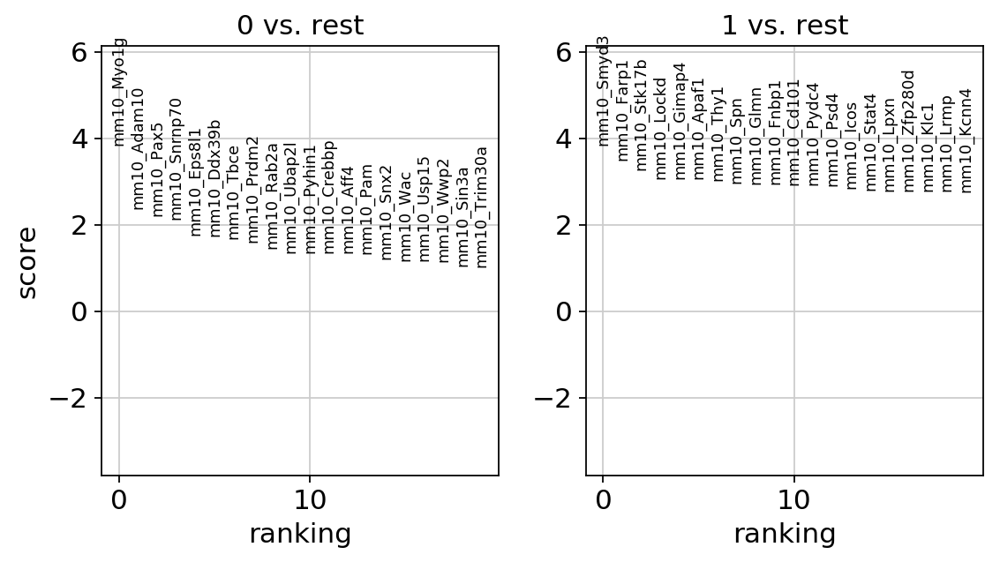

In [621]:
sc.settings.verbosity = 0 
warnings.filterwarnings('ignore')
sc.tl.rank_genes_groups(immune_sub2,groupby='leiden', n_genes=300)
warnings.filterwarnings('default')
sc.pl.rank_genes_groups(immune_sub2)
sc.settings.verbosity = 3

In [546]:
list(map(lambda x: print(x[5:]),immune_sub2.uns['rank_genes_groups']['names']['0'][:30]));

Malat1
Actb
Myo1g
Macf1
Magi2
Bcas3
Adam10
Pax5
Snrnp70
Eps8l1
Ddx39b
Tbce
Prdm2
Rab2a
Tgfbr1
Ubap2l
Pyhin1
Crebbp
Aff4
Pam
Snx2
Kidins220
Wac
Usp15
Ankrd11
Lrrc8c
Wwp2
Dlg1
Sin3a
Trim30a


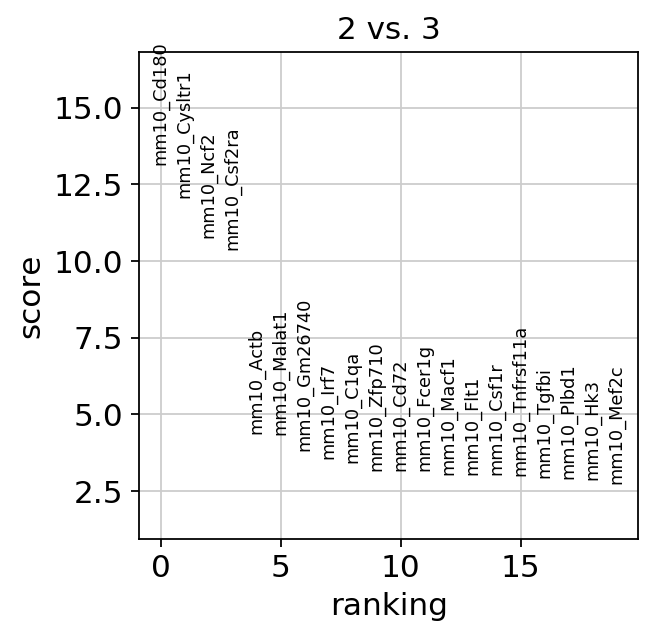

In [495]:
sc.settings.verbosity = 0 
warnings.filterwarnings('ignore')
sc.tl.rank_genes_groups(immune_sub2,groupby='leiden', groups=['2'], reference='')
warnings.filterwarnings('default')
sc.pl.rank_genes_groups(immune_sub2)
sc.settings.verbosity = 3

In [ ]:
list(map(lambda x: print(x[5:]),immune_keep.uns['rank_genes_groups']['names']['5'][:30]));

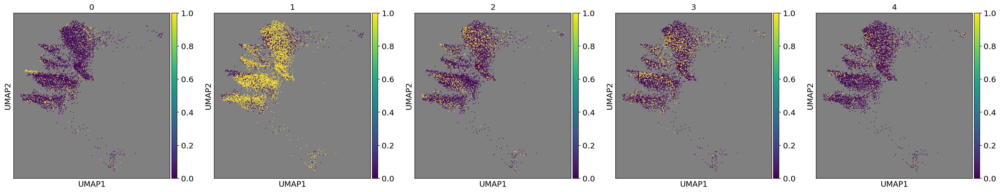

In [154]:
colorby = immune.obs['batch'].unique()
numplots = len(colorby)
fig, axes = plt.subplots(1,numplots,figsize=(25,25/numplots))
for group, ax in zip(colorby,np.ravel(axes)):
    ax.set_facecolor('gray')
    sc.pl.umap(immune,color='batch_%s' % str(group), sort_order=True, title=str(group), 
               ax=ax, return_fig=False, show=False, legend_loc=None, size=8, palette=['red'])
plt.tight_layout()

In [314]:
sc.tl.leiden(immune_sub,resolution=0.8)

running Leiden clustering
    finished: found 7 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


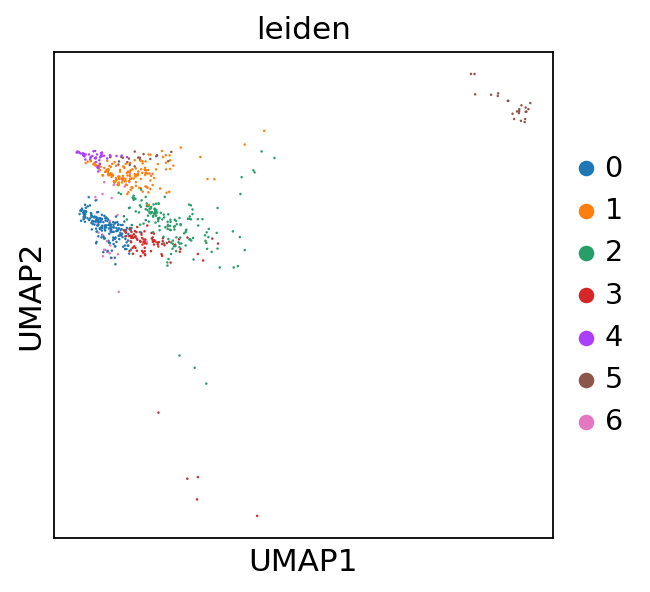

In [315]:
sc.pl.umap(immune_sub, color='leiden', size=5)

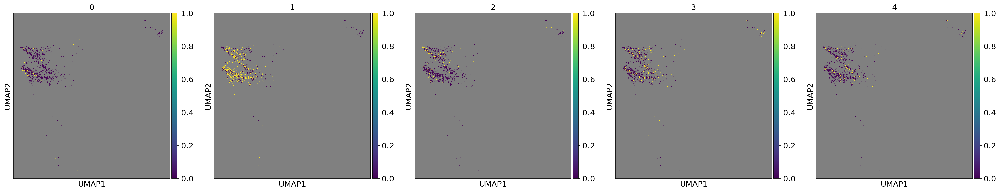

In [325]:
colorby = immune_sub.obs['batch'].unique()
numplots = len(colorby)
fig, axes = plt.subplots(1,numplots,figsize=(25,25/numplots))
for group, ax in zip(colorby,np.ravel(axes)):
    ax.set_facecolor('gray')
    sc.pl.umap(immune_sub,color='batch_%s' % str(group), sort_order=True, title=str(group), 
               ax=ax, return_fig=False, show=False, legend_loc=None, size=8, palette=['red'])
plt.tight_layout()

In [316]:
ctdict = dict()
ctdict['ct0'] = [1, 4]
ctdict['ct1'] = [0, 3, 6]
ctdict['ct2'] = [2]
ctdict['ct3'] = [5]
immune_sub.obs['celltype'] = immune_sub.obs['leiden']
for ct in ctdict:
    for clust in ctdict[ct]:
        immune_sub.obs['celltype'].replace(r'^%s$' % str(clust),ct,regex=True, inplace=True)
immune_sub.obs['celltype'] = immune_sub.obs['celltype'].astype('category')

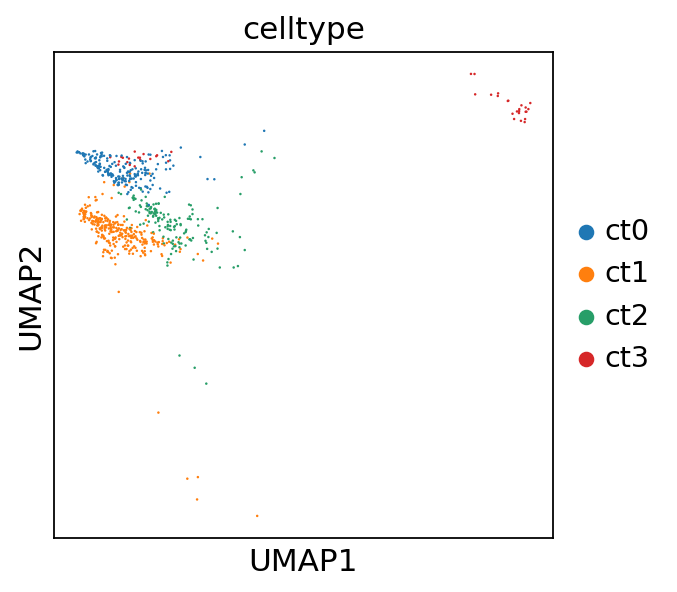

In [318]:
sc.pl.umap(immune_sub, color='celltype', size=5)

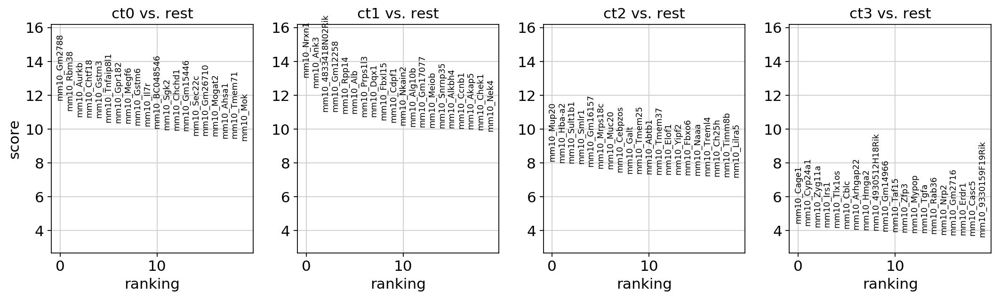

In [329]:
sc.settings.verbosity = 0 
warnings.filterwarnings('ignore')
sc.tl.rank_genes_groups(immune_sub,groupby='celltype')
warnings.filterwarnings('default')
sc.pl.rank_genes_groups(immune_sub)
sc.settings.verbosity = 3

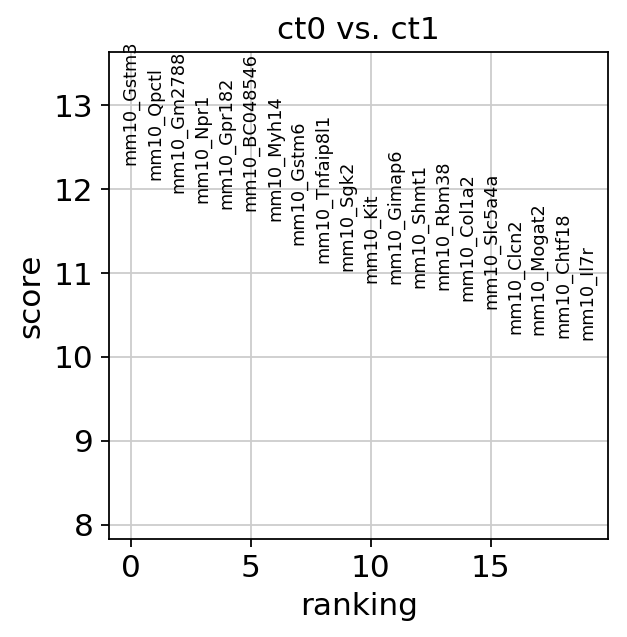

In [326]:
sc.settings.verbosity = 0 
warnings.filterwarnings('ignore')
sc.tl.rank_genes_groups(immune_sub,groupby='celltype', groups=['ct0'], reference='ct1')
warnings.filterwarnings('default')
sc.pl.rank_genes_groups(immune_sub)
sc.settings.verbosity = 3

In [327]:
list(map(lambda x: print(x[5:]),immune_sub.uns['rank_genes_groups']['names']['ct0'][:30]));

Gstm3
Qpctl
Gm2788
Npr1
Gpr182
BC048546
Myh14
Gstm6
Tnfaip8l1
Sgk2
Kit
Gimap6
Shmt1
Rbm38
Col1a2
Slc5a4a
Clcn2
Mogat2
Chtf18
Il7r
Fam124a
Notum
Aurkb
Pdzrn3
Zbtb12
Rgs16
Magix
Chchd1
Ugt2b35
Megf6


## Better Subclustering?

### Try 1

Try to regress out PCs that correlate with cancer, liver, and human genes.

In [45]:
# adata.write_h5ad('/myvol/data2/deep/concat.deep.adata.m.and.h.combatted.dimred.regressed.combatted.dimred.h5ad')
adata = sc.read_h5ad('/myvol/data2/deep/concat.deep.adata.m.and.h.combatted.dimred.regressed.combatted.dimred.h5ad')

In [46]:
immune = adata[adata.obs_names[adata.obs['celltype'] == 'Immune and LSEC'].values].copy()

In [47]:
contam_genes = np.concatenate([liver_genes, cancer_genes])

In [48]:
other_genes = [i for i in immune.var_names if i not in contam_genes]

In [49]:
bad_pcs = list()

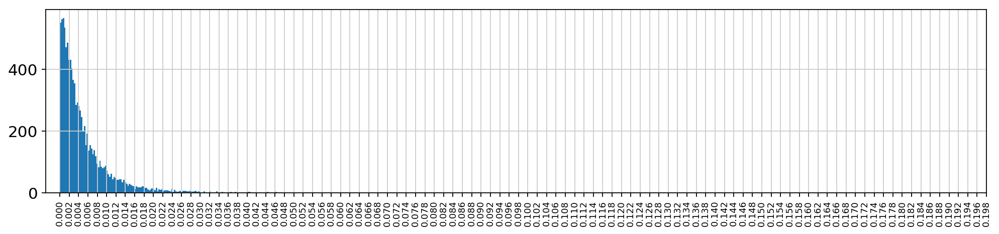

In [50]:
to_plot = list()
rand_pcs = list()
for i in np.random.choice(other_genes,size=100):
    vals = immune.varm['PCs'][immune.var_names.tolist().index(i),:]
    to_plot.append(np.absolute(vals))
    rand_pcs.append(np.argwhere(vals > 0.008))
plt.figure(figsize=(15,3)) 
plt.hist(np.ravel(to_plot),bins=200);
plt.xticks(np.arange(0,0.2,0.002), rotation=90, size=8);

[(2, 15), (58, 15), (92, 15), (1, 14), (5, 14), (46, 14), (62, 14), (90, 14), (38, 13), (43, 13)]


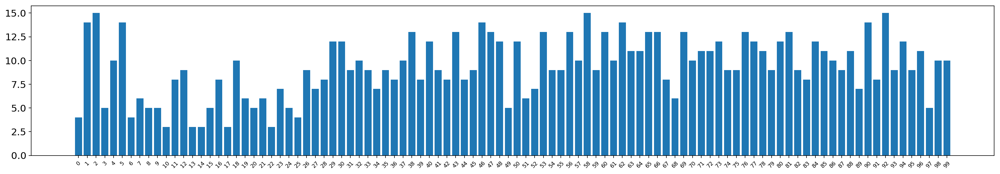

In [51]:
vals, counts = np.unique(np.concatenate(rand_pcs).flatten(),return_counts=True)

plt.figure(figsize=(25,4))
plt.bar(vals, counts);
plt.xticks(ticks=range(100),labels=range(100),rotation=45, size=8)
plt.grid()

print(sorted(list(zip(vals,counts)),key= lambda x: x[1], reverse=True)[:10])

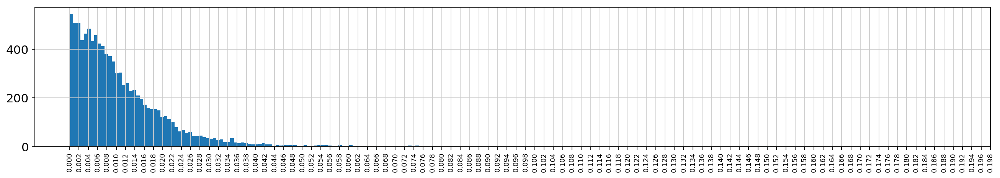

In [52]:
to_plot = list()
liver_pcs = list()
for i in liver_genes:
    vals = immune.varm['PCs'][immune.var_names.tolist().index(i),:]
    to_plot.append(np.absolute(vals))
    liver_pcs.append(np.argwhere(vals > 0.030))
plt.figure(figsize=(20,3)) 
plt.hist(np.ravel(to_plot),bins=200);
plt.xticks(np.arange(0,0.2,0.002), rotation=90, size=8);

[(4, 33), (20, 31), (18, 26), (2, 19), (5, 18), (21, 18), (0, 16), (27, 12), (12, 10), (11, 9)]


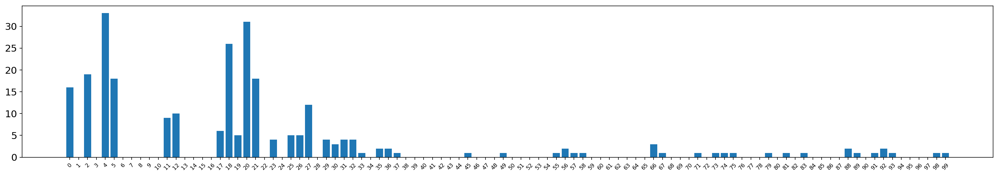

In [53]:
vals, counts = np.unique(np.concatenate(liver_pcs).flatten(),return_counts=True)

plt.figure(figsize=(25,4))
plt.bar(vals, counts);
plt.xticks(ticks=range(100),labels=range(100),rotation=45, size=8)
plt.grid()

print(sorted(list(zip(vals,counts)),key= lambda x: x[1], reverse=True)[:10])

In [54]:
bad_pcs.append([4])

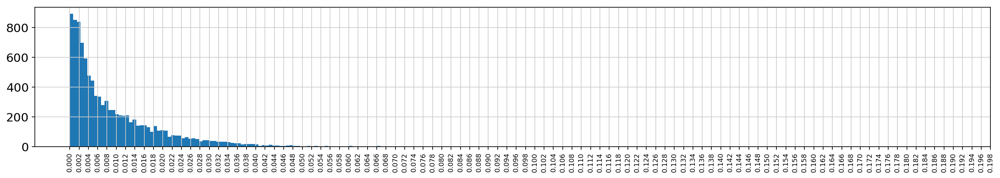

In [55]:
to_plot = list()
cancer_pcs = list()
for i in cancer_genes:
    vals = immune.varm['PCs'][immune.var_names.tolist().index(i),:]
    to_plot.append(np.absolute(vals))
    cancer_pcs.append(np.argwhere(vals > 0.022))
plt.figure(figsize=(20,3)) 
plt.hist(np.ravel(to_plot),bins=200);
plt.xticks(np.arange(0,0.2,0.002), rotation=90, size=8);

[(20, 17), (21, 16), (19, 15), (33, 11), (43, 10), (57, 10), (58, 10), (59, 10), (26, 9), (46, 9)]


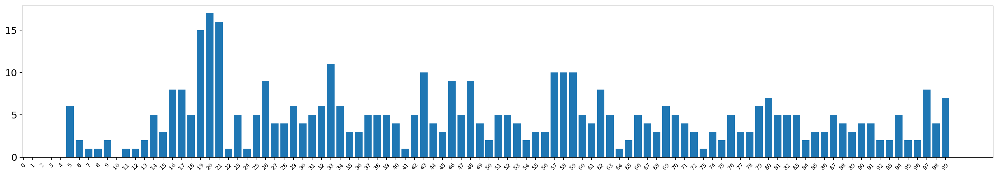

In [56]:
vals, counts = np.unique(np.concatenate(cancer_pcs).flatten(),return_counts=True)

plt.figure(figsize=(25,4))
plt.bar(vals, counts);
plt.xticks(ticks=range(100),labels=range(100),rotation=45, size=8)
plt.grid()

print(sorted(list(zip(vals,counts)),key= lambda x: x[1], reverse=True)[:10])

In [58]:
bad_pcs.append([20])

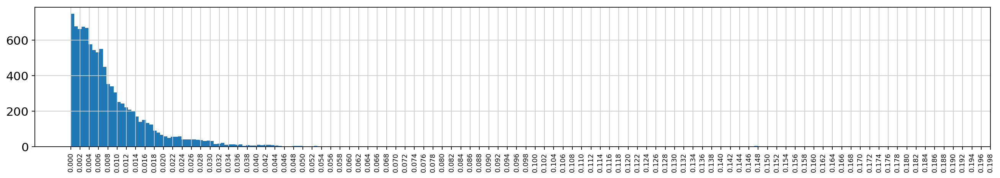

In [60]:
to_plot = list()
human_pcs = list()
for i in human_genes:
    vals = immune.varm['PCs'][immune.var_names.tolist().index(i),:]
    to_plot.append(np.absolute(vals))
    human_pcs.append(np.argwhere(vals > 0.02))
plt.figure(figsize=(20,3)) 
plt.hist(np.ravel(to_plot),bins=200);
plt.xticks(np.arange(0,0.2,0.002), rotation=90, size=8);

[(1, 100), (10, 69), (12, 36), (18, 23), (26, 23), (14, 21), (15, 21), (13, 20), (25, 20), (7, 17)]


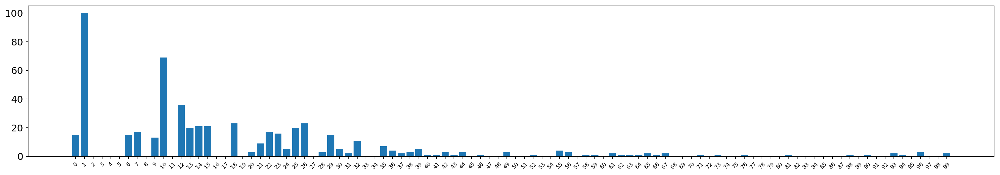

In [61]:
vals, counts = np.unique(np.concatenate(human_pcs).flatten(),return_counts=True)

plt.figure(figsize=(25,4))
plt.bar(vals, counts);
plt.xticks(ticks=range(100),labels=range(100),rotation=45, size=8)
plt.grid()

print(sorted(list(zip(vals,counts)),key= lambda x: x[1], reverse=True)[:10])

In [62]:
bad_pcs.append([1])

In [63]:
keep_genes = [i for i in immune.var_names if i not in liver_genes and i not in cancer_genes and i not in human_genes]

In [64]:
immune = immune[:,keep_genes].copy()

In [65]:
set([i for j in bad_pcs for i in j])

{1, 4, 20}

In [66]:
bad_pcs = list(set([i for j in bad_pcs for i in j]))

In [67]:
for i, j in zip(bad_pcs, range(1,len(bad_pcs) + 1)):
    immune.obs['contam_pc_%s' % str(j)] = immune.obsm['X_pca'][:,i]

In [68]:
immune.obs.columns

Index(['batch', 'percent_mito_mouse', 'percent_mito_human', 'n_counts',
       'leiden', 'batch_0', 'batch_1', 'batch_2', 'batch_3', 'batch_4',
       'celltype', 'contam_pc_1', 'contam_pc_2', 'contam_pc_3'],
      dtype='object')

In [69]:
sc.pp.regress_out(immune,keys=['contam_pc_%s' % i for i in range(1,len(bad_pcs) + 1)])

regressing out ['contam_pc_1', 'contam_pc_2', 'contam_pc_3']


/usr/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning: numpy.ufunc size changed, may indicate binary incompatibility. Expected 192 from C header, got 216 from PyObject
  return f(*args, **kwds)


    finished (0:01:45)


In [81]:
immune_new = immune.copy()

In [82]:
sc.pp.scale(immune_new,max_value=10)

In [99]:
hv_adata = hv_check(immune)

extracting highly variable genes
    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


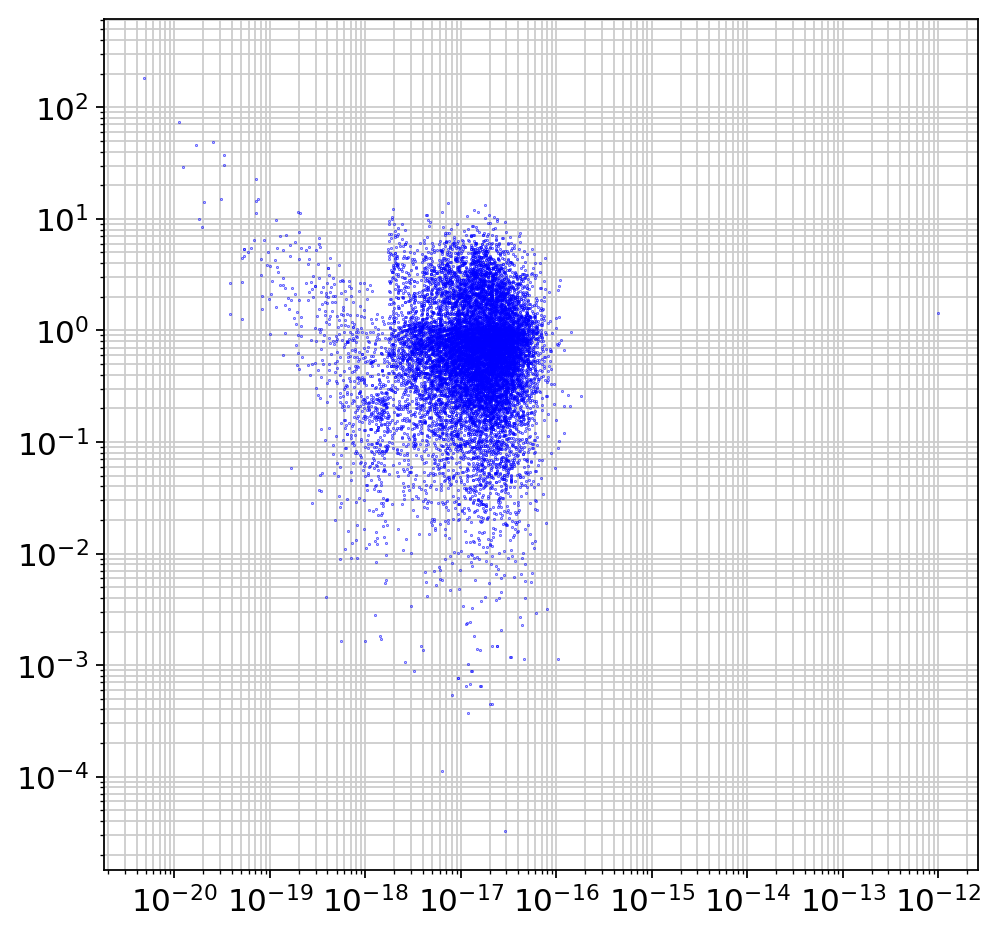

In [100]:
hv_plot(hv_adata)

In [119]:
gate1 = np.array([(3e-18, 1.2e0), (3e-18, 2e1), (1e-16, 2e1), (1e-16, 1.2e0)]) # immune
# gate1 = np.array([(1.8e-17, 1e-3), (1.8e-17, 2e0), (3, 2e0), (3, 1e-3)]) # immune_new

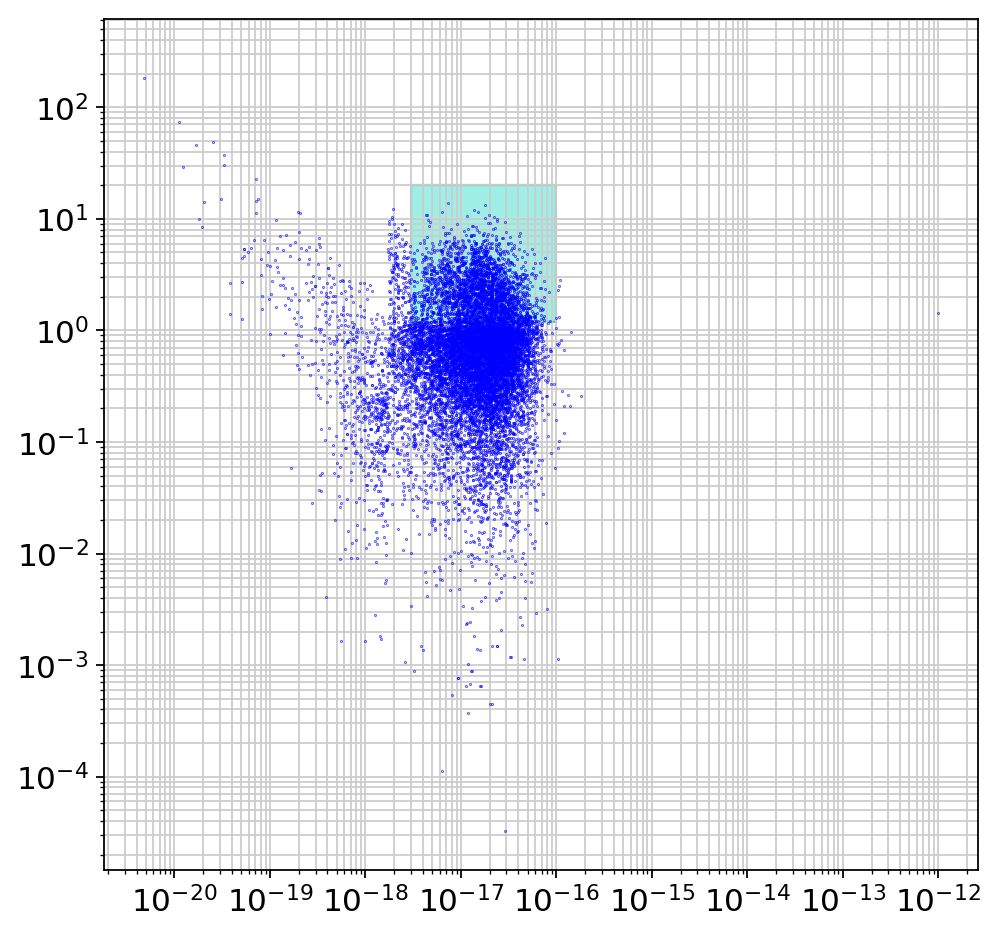

In [120]:
hv_plot(hv_adata, gate=gate1)

In [107]:
immune = hv_genes(hv_adata,gate1, immune)

In [109]:
immune = immune[:,[i for i in immune.var_names if not i.startswith('hg19_')]].copy()

In [110]:
immune.var_names

Index(['mm10_Mrpl15', 'mm10_St18', 'mm10_Pcmtd1', 'mm10_Cspp1',
       'mm10_A830018L16Rik', 'mm10_Ncoa2', 'mm10_Terf1', 'mm10_Rpl7',
       'mm10_Stau2', 'mm10_Tceb1',
       ...
       'mm10_Ccdc186', 'mm10_Ablim1', 'mm10_Fam160b1', 'mm10_Pdzd8',
       'mm10_Fam204a', 'mm10_Cacul1', 'mm10_Fam45a', 'mm10_Grk5', 'mm10_Tmlhe',
       'mm10_DHRSX'],
      dtype='object', name='index', length=2693)

In [111]:
sc.pp.pca(immune, n_comps=300)

Note that scikit-learn's randomized PCA might not be exactly reproducible across different computational platforms. For exact reproducibility, choose `svd_solver='arpack'.` This will likely become the Scanpy default in the future.
computing PCA with n_comps = 300
    finished (0:00:01)


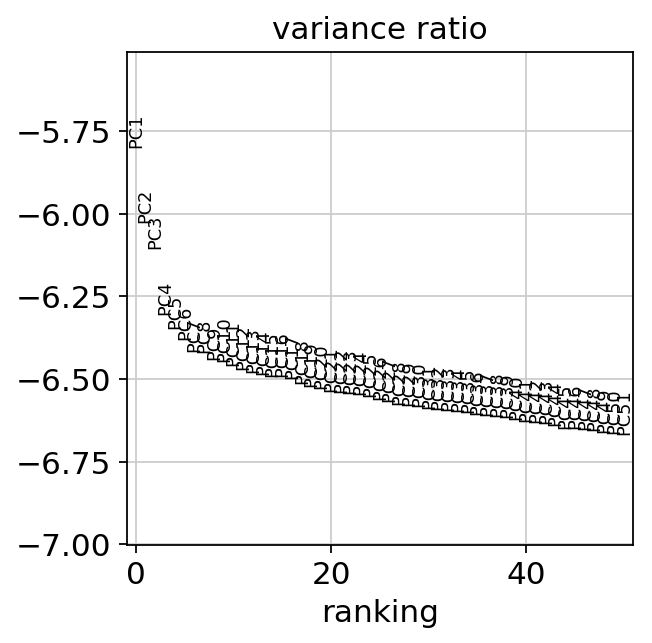

In [112]:
sc.pl.pca_variance_ratio(immune, n_pcs=50, log=True)

In [114]:
warnings.filterwarnings('ignore')
sc.pp.neighbors(immune,n_neighbors=15,n_pcs=6) # numba warning outlined here is not to be of concern: https://github.com/lmcinnes/umap/issues/252
warnings.filterwarnings('default')

computing neighbors
    using 'X_pca' with n_pcs = 6
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:00)


In [115]:
sc.tl.umap(immune)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:13)


In [116]:
sc.tl.leiden(immune,resolution=0.4)

running Leiden clustering
    finished: found 8 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:01)


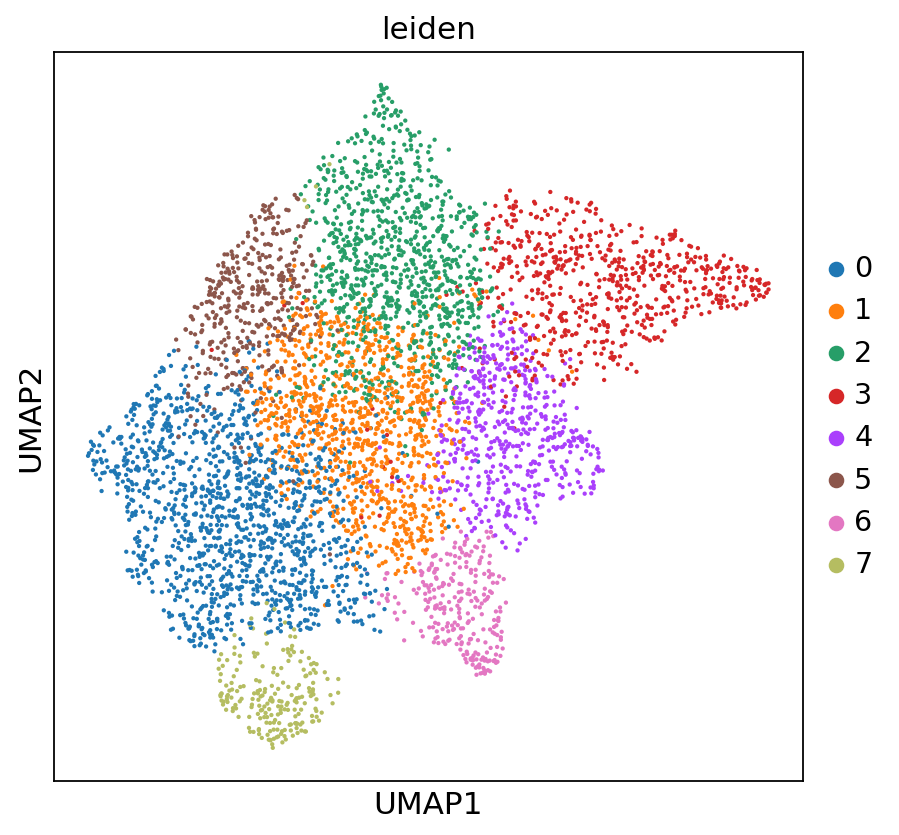

In [117]:
fig, ax = plt.subplots(1,1,figsize=(6,6))
sc.pl.umap(immune,color=['leiden'], ax=ax, size=15, palette=sc.pl.palettes.vega_20_scanpy)

In [126]:
# immune_new = immune[:,[i for i in immune.var_names if i.startswith('mm10')]].copy()

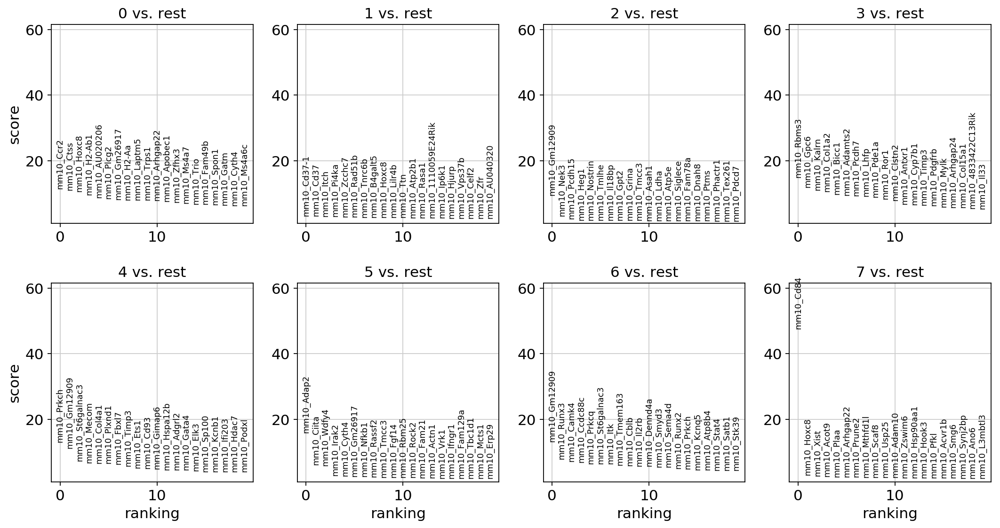

In [118]:
sc.settings.verbosity = 0 
warnings.filterwarnings('ignore')
sc.tl.rank_genes_groups(immune,groupby='leiden')
warnings.filterwarnings('default')
sc.pl.rank_genes_groups(immune)
sc.settings.verbosity = 3

It seems like having the human genes in the matrix for PCA is critical for good clustering. That seems like a problem.

In [150]:
def process1(adata):
    sc.pp.log1p(adata)
    sc.pp.normalize_per_cell(adata)
    return adata

In [151]:
immune = process1(immune)

normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


In [131]:
def process2_check(adata,min_mean=0.0125, min_disp=0.5, max_mean=3):    # Extract out highly variable genes, but don't subset just yet.
    hv_adata = adata.copy()
    sc.pp.highly_variable_genes(hv_adata, flavor='cell_ranger',inplace=True, 
                                min_mean=min_mean, 
                                min_disp=min_disp, 
                                max_mean=max_mean,
                                n_bins=500)
    return hv_adata

In [132]:
hv_adata = process2_check(immune)

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


In [133]:
gate1 = np.array([(3e-4, 4e0), (3e-4, 2e2), (4e0, 2e2), (4e0, 5e-1)])

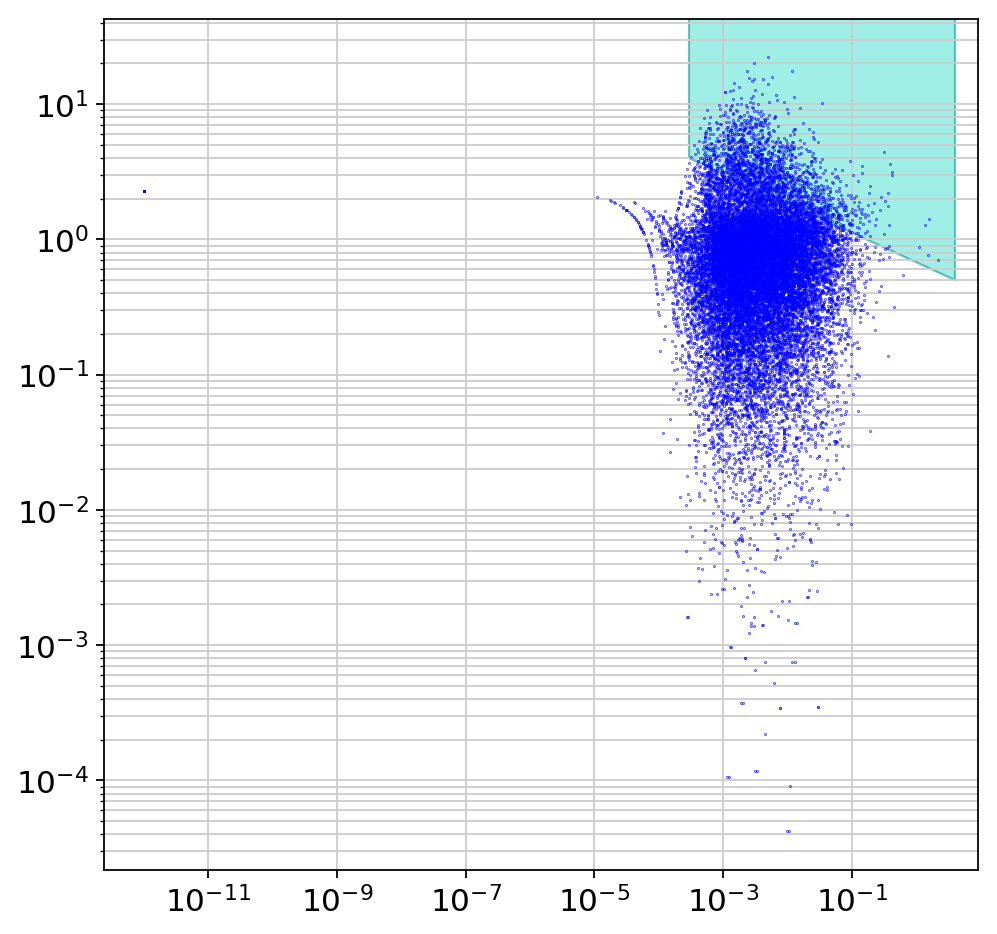

In [134]:
plt.figure(figsize=(7,7))
plt.plot(hv_adata.var['means'].values,hv_adata.var['dispersions_norm'].values,linewidth=0, marker='.',markersize=0.5, color='b');
plt.minorticks_on()
plt.xscale('log')
plt.yscale('log')
plt.grid(True,which='both',axis='both')
ax = plt.gca()

gatepatch = patches.Polygon(gate1,linewidth=1,edgecolor='teal',facecolor='turquoise',alpha=0.5)
ax.add_patch(gatepatch);

In [135]:
genes = list()
means = hv_adata.var['means'].values
disps = hv_adata.var['dispersions_norm'].values
pointsmap = map(Point,means,disps)
polygon = Polygon(gate1)
for i in tqdm(pointsmap,total=len(means)):
    genes.append(polygon.contains(i))

/usr/local/lib/python3.6/dist-packages/tqdm/__init__.py:27: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  TqdmDeprecationWarning)


In [136]:
sum(genes)

544

In [137]:
immune = immune[:,genes].copy()

In [138]:
immune

AnnData object with n_obs × n_vars = 5423 × 544 
    obs: 'batch', 'percent_mito_mouse', 'percent_mito_human', 'n_counts'
    var: 'n_counts', 'n_cells'

In [139]:
sc.pp.scale(immune, max_value=10)

In [140]:
sc.pp.pca(immune, n_comps=100)

Note that scikit-learn's randomized PCA might not be exactly reproducible across different computational platforms. For exact reproducibility, choose `svd_solver='arpack'.` This will likely become the Scanpy default in the future.
computing PCA with n_comps = 100
    finished (0:00:00)


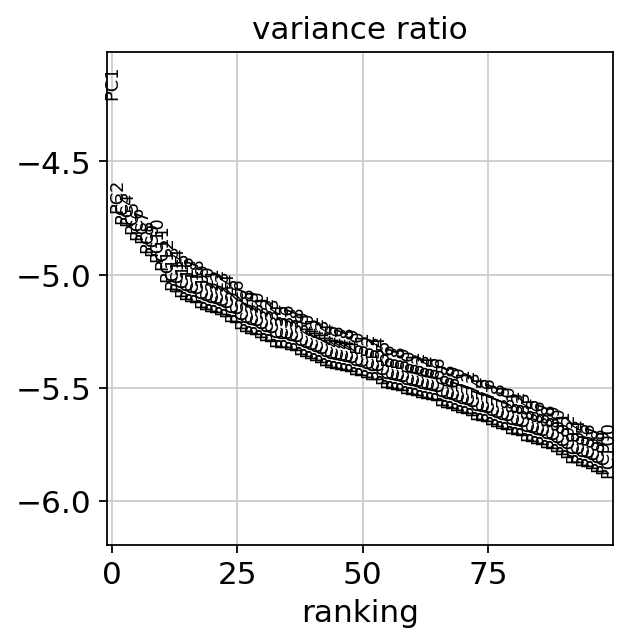

In [148]:
sc.pl.pca_variance_ratio(immune,log=True, n_pcs=100)

In [144]:
warnings.filterwarnings('ignore')
sc.pp.neighbors(immune,n_neighbors=15,n_pcs=12) # numba warning outlined here is not to be of concern: https://github.com/lmcinnes/umap/issues/252
warnings.filterwarnings('default')

computing neighbors
    using 'X_pca' with n_pcs = 12
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:00)


In [145]:
sc.tl.umap(immune)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:23)


In [146]:
sc.tl.leiden(immune,resolution=0.5)

running Leiden clustering
    finished: found 17 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


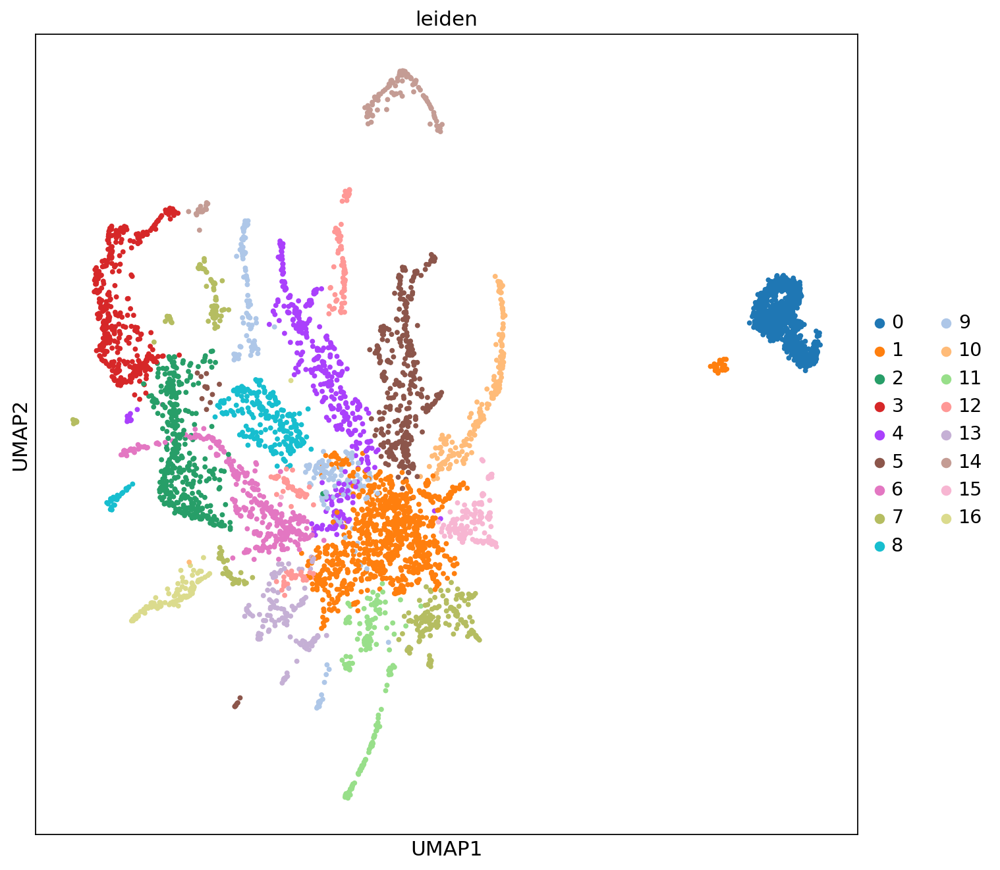

In [147]:
fig, ax = plt.subplots(1,1,figsize=(10,10))
sc.pl.umap(immune,color=['leiden'], ax=ax, size=50, palette=sc.pl.palettes.vega_20_scanpy)

In [92]:
# scanpy's stupid sort order doesn't work with categorical variables, need to make a separate covariate with a "continuous" binary scale
for batch in immune.obs['batch'].unique():
    immune.obs['batch_%s' % batch] = (immune.obs['batch'] == batch).astype(int)

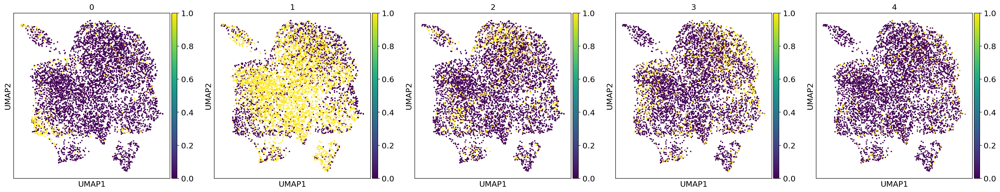

In [93]:
colorby = immune.obs['batch'].unique()
numplots = len(colorby)
fig, axes = plt.subplots(1,numplots,figsize=(25,25/numplots))
for group, ax in zip(colorby,np.ravel(axes)):
    sc.pl.umap(immune,color='batch_%s' % str(group), sort_order=True, title=str(group), 
               ax=ax, return_fig=False, show=False, legend_loc=None, size=25, palette=['red'])
plt.tight_layout()

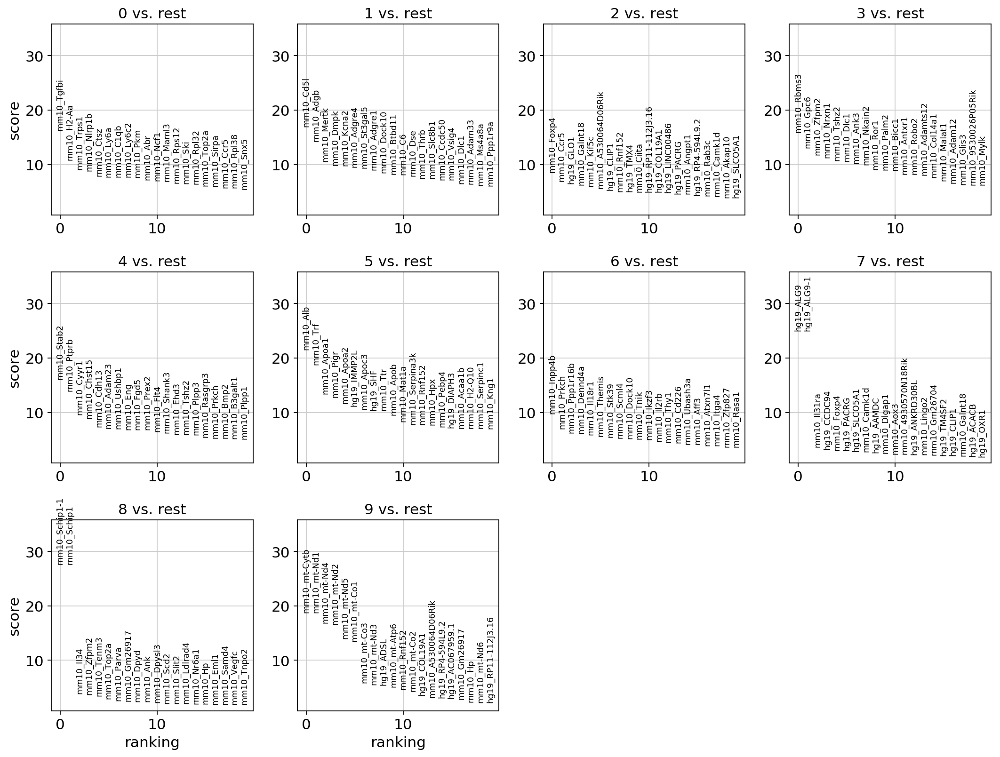

In [94]:
sc.settings.verbosity = 0 
warnings.filterwarnings('ignore')
sc.tl.rank_genes_groups(immune,groupby='leiden')
warnings.filterwarnings('default')
sc.pl.rank_genes_groups(immune)
sc.settings.verbosity = 3

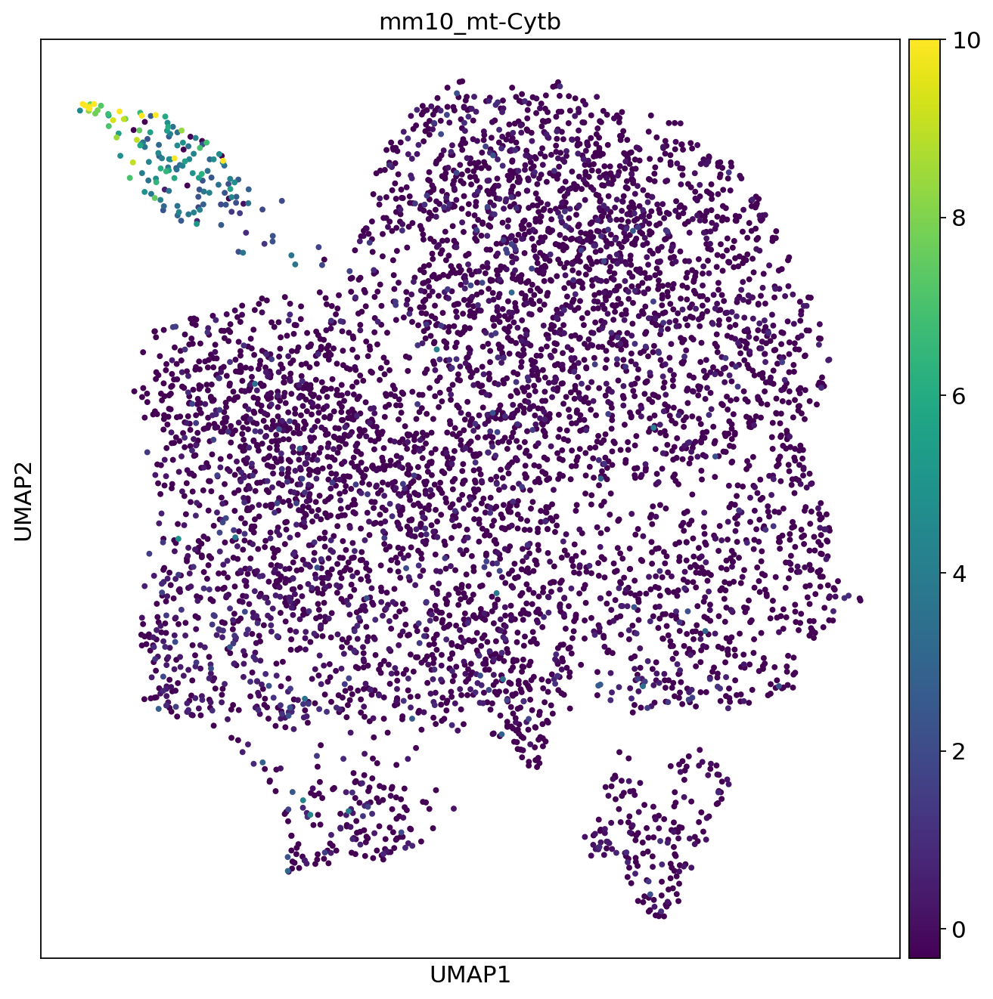

In [112]:
fig, ax = plt.subplots(1,1,figsize=(10,10))
sc.pl.umap(immune,color='mm10_mt-Cytb', ax=ax, size=50, palette=sc.pl.palettes.vega_20_scanpy)

In [151]:
keep_cells = np.setdiff1d(adata.obs_names.values, crap_cells)

In [154]:
with open('/myvol/data2/concat1.deep.keepcells.txt','w') as file:
    for i in keep_cells:
        file.write(i + '\n')